In [2]:
import numpy as np
from astropy import units as u, constants as const
from matplotlib import pyplot as plt
from scipy.stats import beta
from scipy.special import beta as betafct
from numba import jit, jitclass
from scipy import interpolate
from scipy.interpolate import interp1d
import logging
import sys
import os
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils, analtyic_formulas
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
importlib.reload(analtyic_formulas)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
from analtyic_formulas import *
import cProfile
import pstats
import numdifftools as nd
from findiff import FinDiff
from scipy.interpolate import CubicSpline, splrep, splev

import warnings
warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
H0 = 2/(3*t_i)
ss = SelfSimilarSolution(t_i, G, rho_H)

def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min. That is, the inner edge of the innermost shell is at r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N

def make_cycloid_config(r_min=1e-2, r_max=1, N=1, t_max=5000, dt_min=1e-9, rho_bar=rho_H, delta_i=1, stepper_strategy='velocity_verlet', timescale_strategy='dyn', save_strategy='vflip', safety_factor=1e-4, reflect_bool=False, save_dt=1e-2, j_coeff=0, softlen=0, thickness_coef=0, irs='r0min_start_equal', mes='overlap_inclusive', pressure_strategy='zero', polytropic_index=-1, polytropic_coef=0, accel_strategy='soft_all', r_th=None, no_pm=False, density_strategy='background_plus_tophat2', relaxation_time=0, energy_strategy='kin_grav_rot', H=H0, drhodr_strategy='finite_diff', cq=0, hbar2_over_m2=0, fn=None):
    if r_th is None:
        r_th = r_max
    m_pert = rho_bar * delta_i * 4/3 * np.pi * min(r_max, r_th)**3
    if no_pm:
        point_mass = 0
        shell_volume_strategy = 'keep_edges'
    else:
        point_mass = 4/3 * np.pi * r_min**3 * rho_bar * (1+delta_i)
        shell_volume_strategy = 'inner_not_zero'

    r0_min = compute_r0_min(r_min=r_min, r_max=r_max, N=N)
    r_min_strategy = 'reflect' if reflect_bool else 'absorb'
    # if energy_strategy == 'gas':
    #     t_ta_strategy = 't_ta_gas'
    #     r_ta_strategy = 'r_ta_gas'
    # else:
    t_ta_strategy = 't_ta_cycloid'
    r_ta_strategy = 'r_ta_cycloid'
    if j_coeff > 0:
        ang_mom_strategy = 'const'
        #ang_mom_strategy = 'gmr'
    else:
        ang_mom_strategy = 'zero'
    return {
        'point_mass': point_mass,
        'initial_radius_strategy': irs,
        'density_strategy': density_strategy,
        'delta': delta_i,
        'tophat_radius': r_th,
        'r0_min': r0_min,
        'rho_bar': rho_H,
        't_max': t_max,
        'dt_min': dt_min,
        'N': N,
        'r_min': r_min,
        'r_min_strategy': r_min_strategy,
        'H': H,
        'r_max': r_max,
        'm_pert': m_pert, 
        'stepper_strategy': stepper_strategy,
        'timescale_strategy': timescale_strategy,
        'save_strategy': save_strategy,
        'safety_factor': safety_factor,
        'save_dt': save_dt,
        'j_coef': j_coeff,
        'ang_mom_strategy': ang_mom_strategy,
        'r_ta_strategy': r_ta_strategy,
        't_ta_strategy': t_ta_strategy,
        'save_strategy': 'vflip',
        'softlen': softlen,
        'thickness_coef': thickness_coef,
        'm_enc_strategy': mes,
        'pressure_strategy': pressure_strategy,
        'polytropic_index': polytropic_index,
        'polytropic_coef': polytropic_coef,
        'accel_strategy': accel_strategy,
        'shell_volume_strategy': shell_volume_strategy,
        'relaxation_time': relaxation_time,
        'energy_strategy': energy_strategy,
        'drhodr_strategy': drhodr_strategy,
        'viscosity_cq': cq,
        'hbar2_over_m2': hbar2_over_m2,
        'save_filename': fn,
    }

def run_and_plot(config, profile=False):
    sc = SphericalCollapse(config)
    if profile:
        # Profile the run method
        profiler = cProfile.Profile()
        profiler.enable()
        results = sc.run()
        profiler.disable()

        # Print the profiling results
        stats = pstats.Stats(profiler).sort_stats('cumulative')
        stats.print_stats(50)  # Print top 50 time-consuming functions
    else:
        results = sc.run() 
    plotter = SimulationPlotter(results, sc)
    # Configuration 1: Radius analysis
    plotter.plot_radius_analysis()
    # Configuration 2: Velocity and acceleration analysis
    plotter.plot_velocity_acceleration()
    # Configuration 3: Mass, density, and timescales
    plotter.plot_mass_density_timescales()
    # Configuration 4: Energy analysis
    plotter.plot_energy_analysis()
    # Configuration 5: Pressure analysis
    plotter.plot_pressure_analysis()
    return sc, results, plotter

def just_plot(plotter, t_center=None, window=None):
    if (t_center is None) or (window is None):
        plotter.plot_radius_analysis()
        plotter.plot_velocity_acceleration()
        plotter.plot_mass_density_timescales()
        plotter.plot_energy_analysis()
    else:
        t_min = t_center - window
        t_max = t_center + window

        # Add time window to all plots using a custom shell configuration
        shell_config = PlotConfig(
            property_name='',
            xlim=(t_min, t_max)
        )
        plotter.plot_radius_analysis(shell_config=shell_config)
        plotter.plot_velocity_acceleration(shell_config=shell_config)
        plotter.plot_mass_density_timescales(shell_config=shell_config)
        plotter.plot_energy_analysis(shell_config=shell_config)
        plotter.plot_pressure_analysis(shell_config=shell_config)


In [3]:
# Default plotting settings
def my_mpl():
    plt.rc('font', family='serif', size=20)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[9, 5])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [5]:
t_max = 73
config_gauss = make_cycloid_config(N=100, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel_cross_jeans', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='quantum_potential', delta_i=0.2, r_th=1, energy_strategy='quantum_potential', H=H0, save_dt=1e-6, stepper_strategy='leapfrog_kdk', j_coeff=0e-2, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', fn='runs/gauss_N100_se3_fdm3_test', hbar2_over_m2=1e-3)

In [6]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

2025-05-08 08:38:58,207 - collapse - INFO - Simulation setup complete


ValueError: Error on input data

In [17]:
t_max = 1000
config_gauss = make_cycloid_config(N=10, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel_cross', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='quantum_potential', delta_i=0.2, r_th=0.1, energy_strategy='quantum_potential', H=H0, save_dt=1e-6, stepper_strategy='leapfrog_kdk', j_coeff=0e-2, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', fn='runs/gauss_N100_se3_fdm4_test', hbar2_over_m2=1e-5)

2025-05-09 02:02:51,885 - collapse - INFO - Simulation setup complete


2025-05-09 02:06:27,078 - DEBUG - Saved dataset t with shape (10104,)
2025-05-09 02:06:27,079 - DEBUG - Saved dataset dt with shape (10104,)
2025-05-09 02:06:27,098 - DEBUG - Saved dataset r with shape (10104, 10)


2025-05-09 02:06:27,113 - DEBUG - Saved dataset v with shape (10104, 10)
2025-05-09 02:06:27,127 - DEBUG - Saved dataset a with shape (10104, 10)
2025-05-09 02:06:27,138 - DEBUG - Saved dataset m_enc with shape (10104, 10)
2025-05-09 02:06:27,148 - DEBUG - Saved dataset rho_r with shape (10104, 10)
2025-05-09 02:06:27,150 - WARNING - Skipping pressure because all values are None
2025-05-09 02:06:27,151 - WARNING - Skipping dpressure_drho because all values are None
2025-05-09 02:06:27,152 - WARNING - Skipping rho_prime because all values are None
2025-05-09 02:06:27,163 - DEBUG - Saved dataset e_tot with shape (10104, 10)
2025-05-09 02:06:27,174 - DEBUG - Saved dataset e_g with shape (10104, 10)
2025-05-09 02:06:27,184 - DEBUG - Saved dataset e_k with shape (10104, 10)
2025-05-09 02:06:27,194 - DEBUG - Saved dataset e_r with shape (10104, 10)
2025-05-09 02:06:27,195 - WARNING - Skipping e_p because all values are None
2025-05-09 02:06:27,212 - DEBUG - Saved dataset e_q with shape (1010

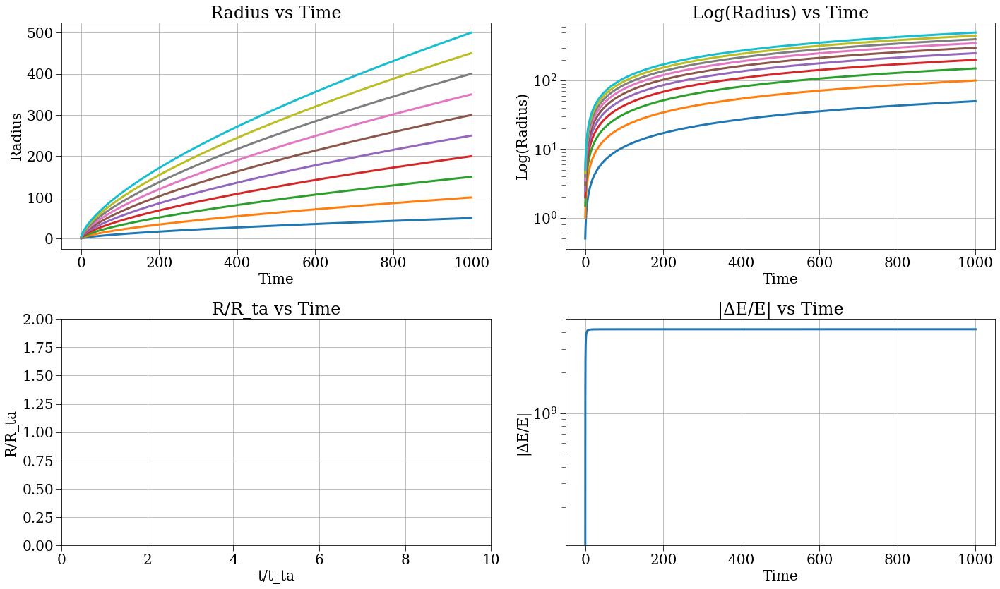

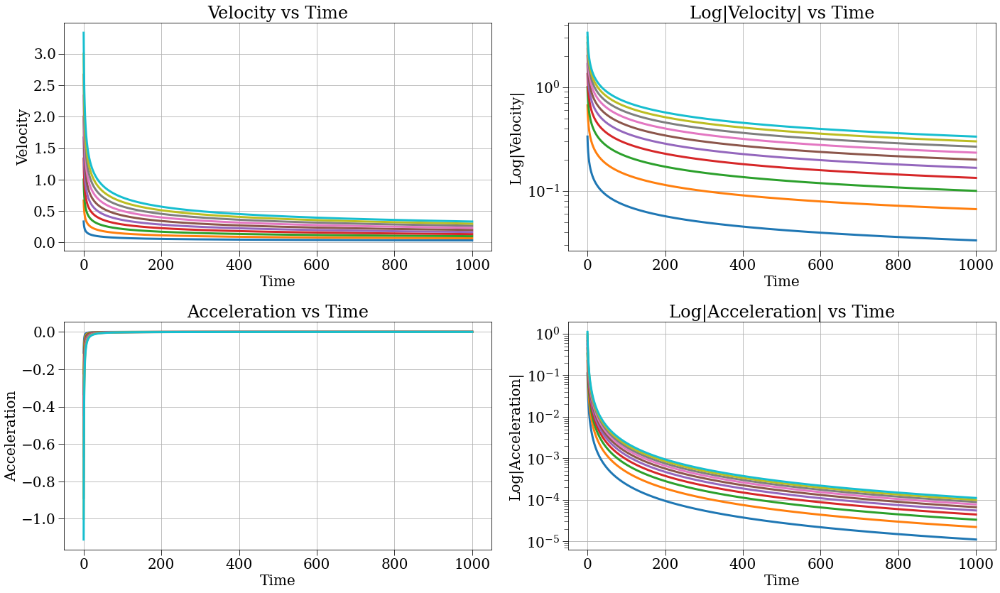

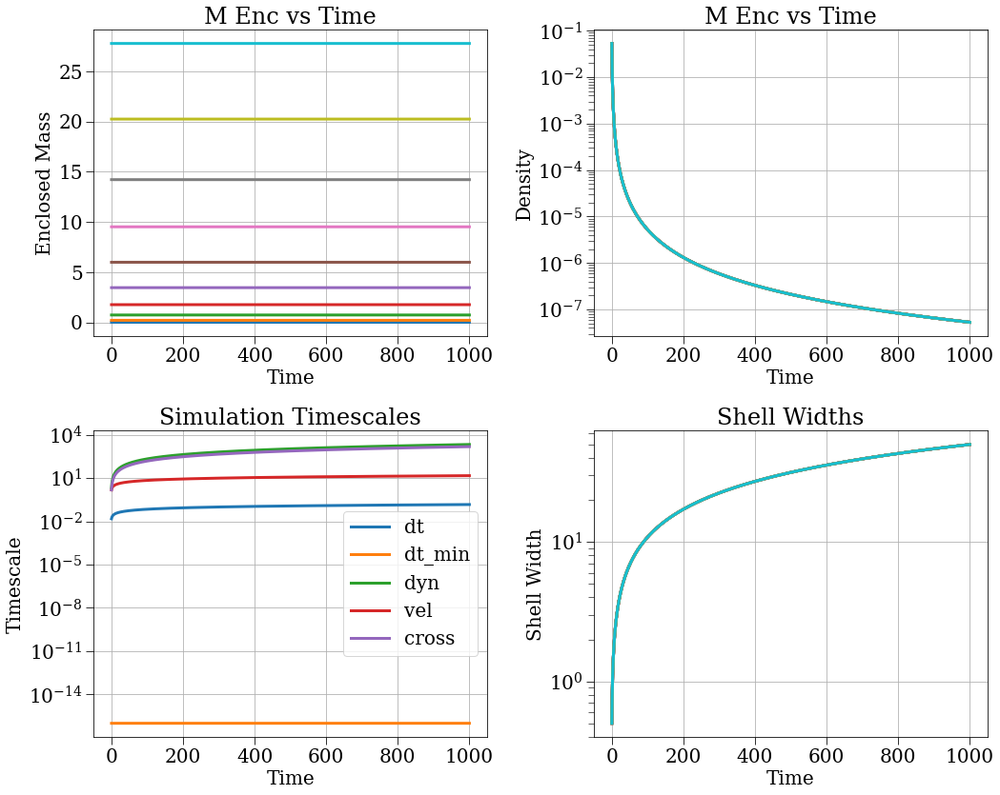

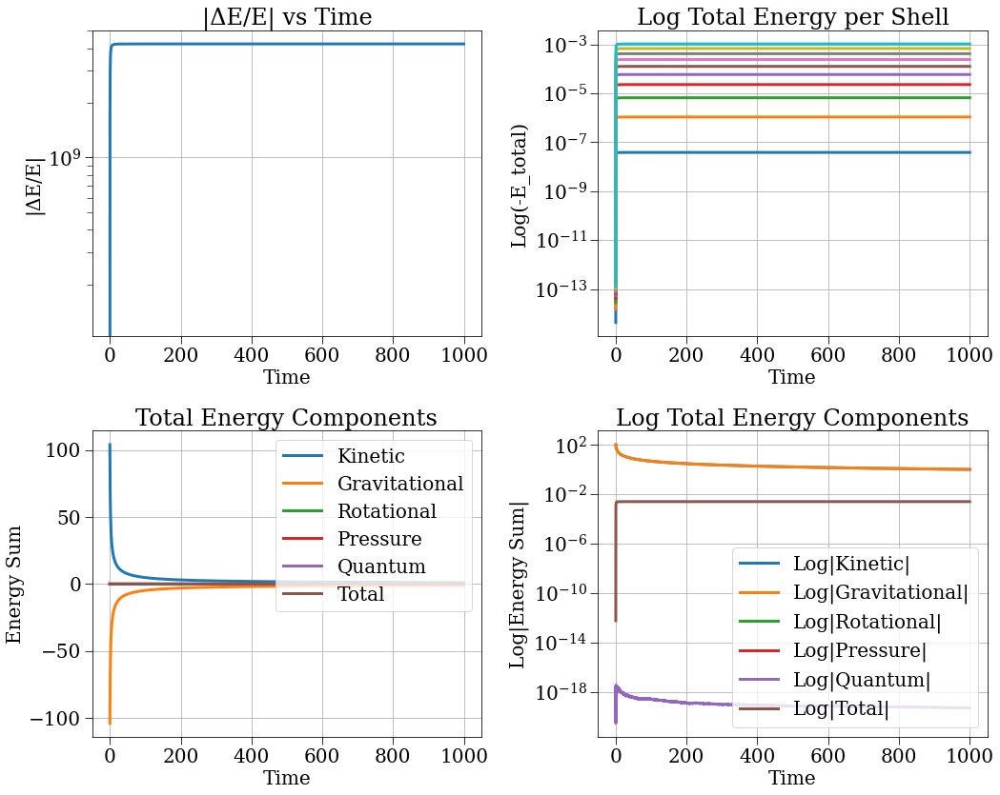

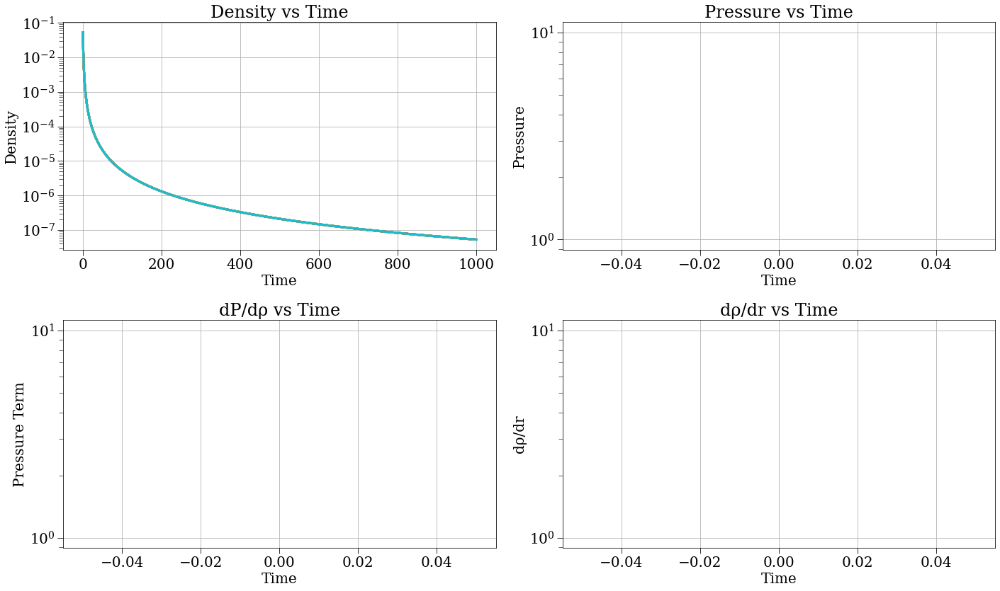

[0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]


In [18]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

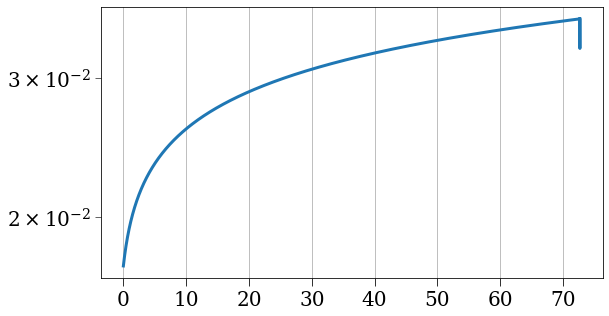

In [12]:
plt.semilogy(r['t'], r['t_jeans'])

In [79]:
t_max = 100
config_gauss = make_cycloid_config(N=100, reflect_bool=False, t_max=t_max, r_min=1e-2, timescale_strategy='dyn_vel', dt_min=0, safety_factor=1e-3, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-2, stepper_strategy='leapfrog_kdk', j_coeff=0, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', fn='runs/gauss_absorb_N100_se3_je2', hbar2_over_m2=0)

2025-05-08 01:35:45,027 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:429: RuntimeWarning: divide by zero encountered in true_divide
  return sim.m / volumes
2025-05-08 01:35:52,242 - DEBUG - Saved dataset t with shape (10001,)
2025-05-08 01:35:52,244 - DEBUG - Saved dataset dt with shape (10001,)
2025-05-08 01:35:52,265 - DEBUG - Saved dataset r with shape (10001, 100)
2025-05-08 01:35:52,293 - DEBUG - Saved dataset v with shape (10001, 100)
2025-05-08 01:35:52,320 - DEBUG - Saved dataset a with shape (10001, 100)


2025-05-08 01:35:52,348 - DEBUG - Saved dataset m_enc with shape (10001, 100)
2025-05-08 01:35:52,374 - DEBUG - Saved dataset rho_r with shape (10001, 100)
2025-05-08 01:35:52,376 - WARNING - Skipping pressure because all values are None
2025-05-08 01:35:52,377 - WARNING - Skipping dpressure_drho because all values are None
2025-05-08 01:35:52,379 - WARNING - Skipping rho_prime because all values are None
2025-05-08 01:35:52,400 - DEBUG - Saved dataset e_tot with shape (10001, 100)
2025-05-08 01:35:52,429 - DEBUG - Saved dataset e_g with shape (10001, 100)
2025-05-08 01:35:52,456 - DEBUG - Saved dataset e_k with shape (10001, 100)
2025-05-08 01:35:52,485 - DEBUG - Saved dataset e_r with shape (10001, 100)
2025-05-08 01:35:52,487 - WARNING - Skipping e_p because all values are None
2025-05-08 01:35:52,488 - WARNING - Skipping e_q because all values are None
2025-05-08 01:35:52,507 - DEBUG - Saved dataset t_dyn with shape (10001,)
2025-05-08 01:35:52,510 - DEBUG - Saved dataset t_vel wit

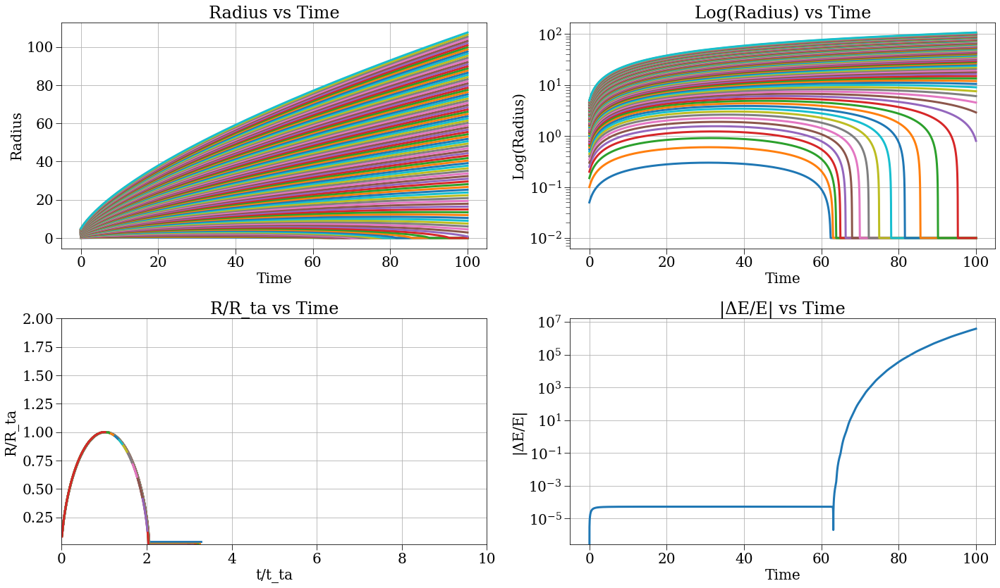

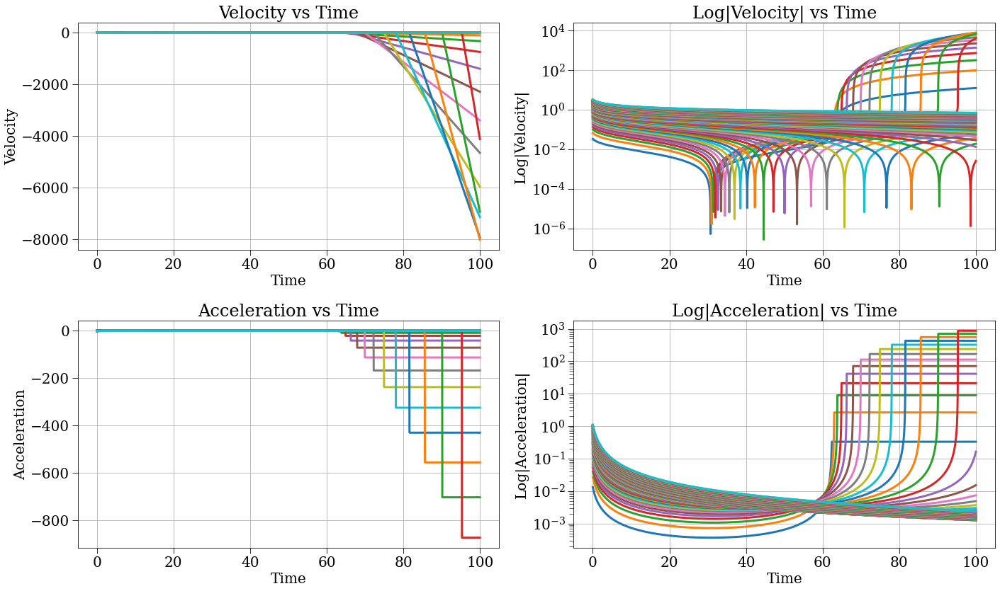

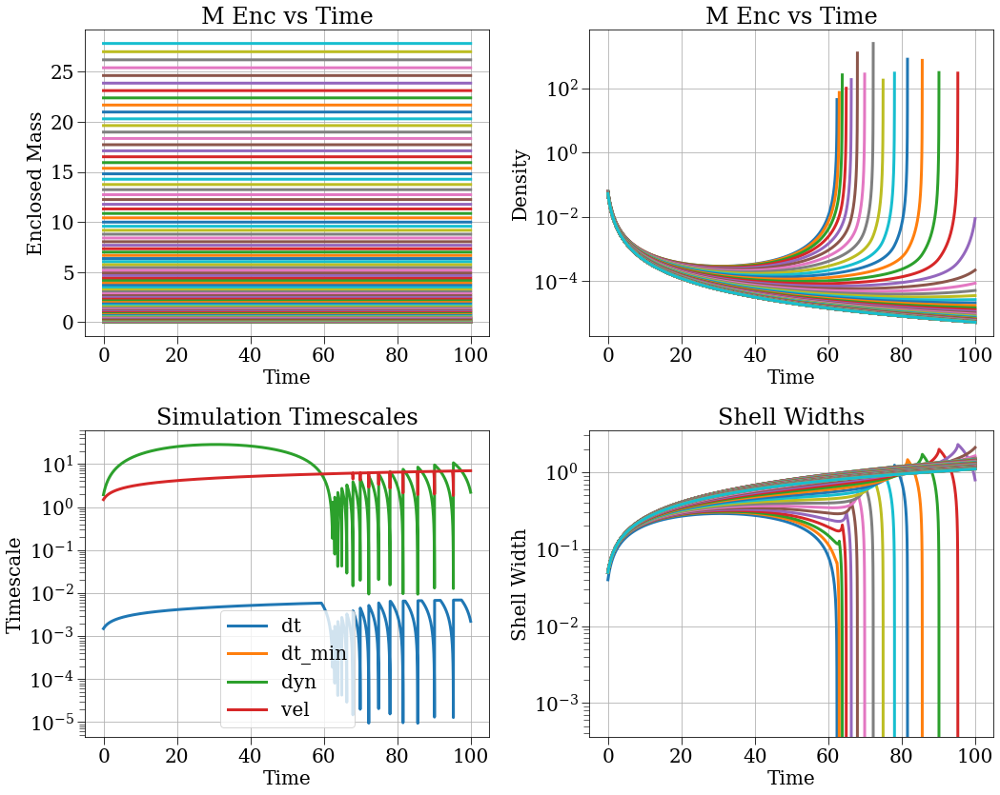

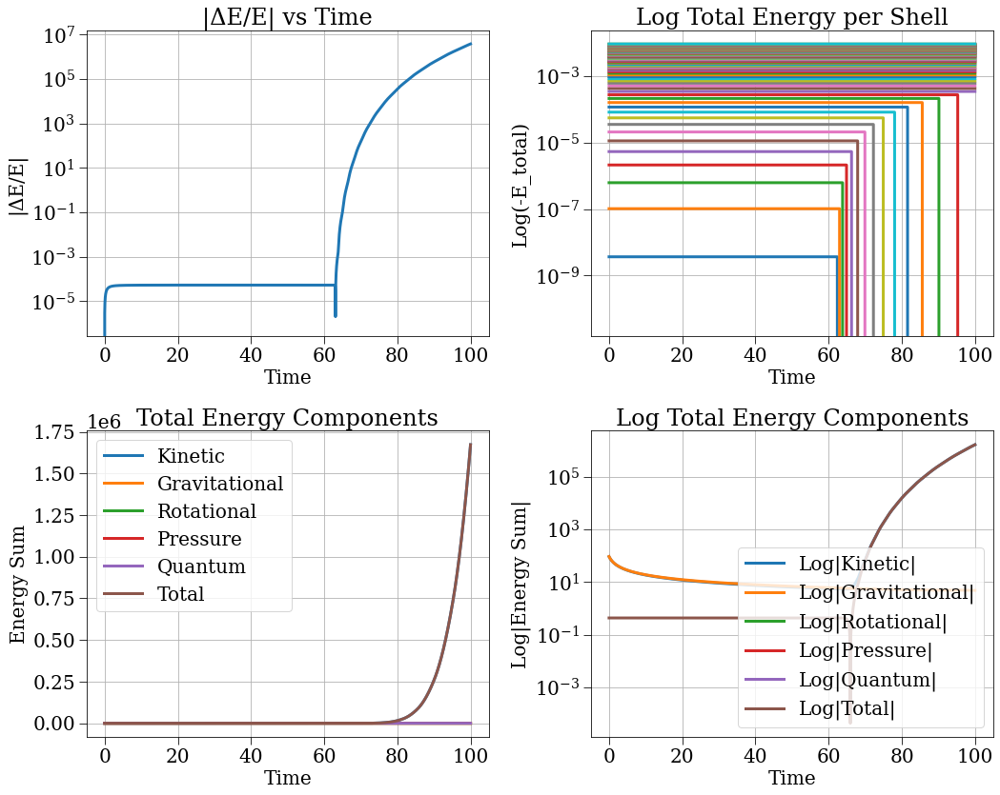

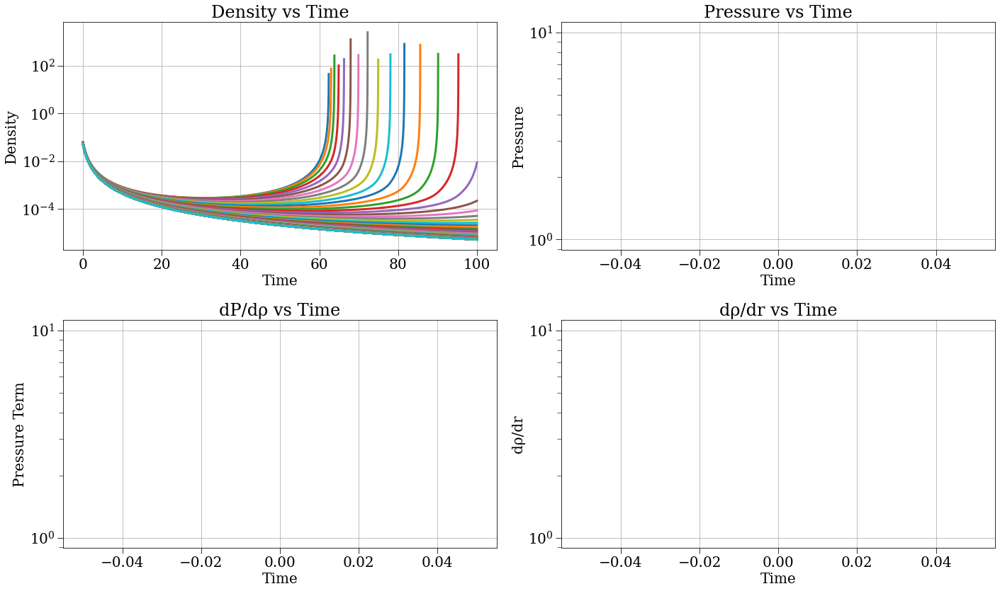

In [80]:
s, r, c = run_and_plot(config_gauss)

2025-05-06 16:14:15,075 - collapse - INFO - Simulation setup complete


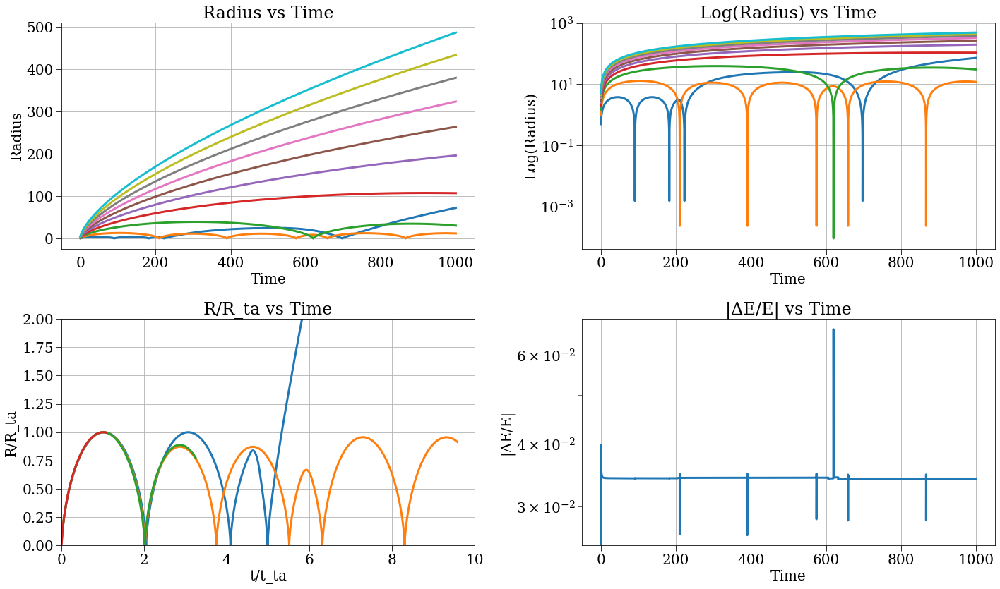

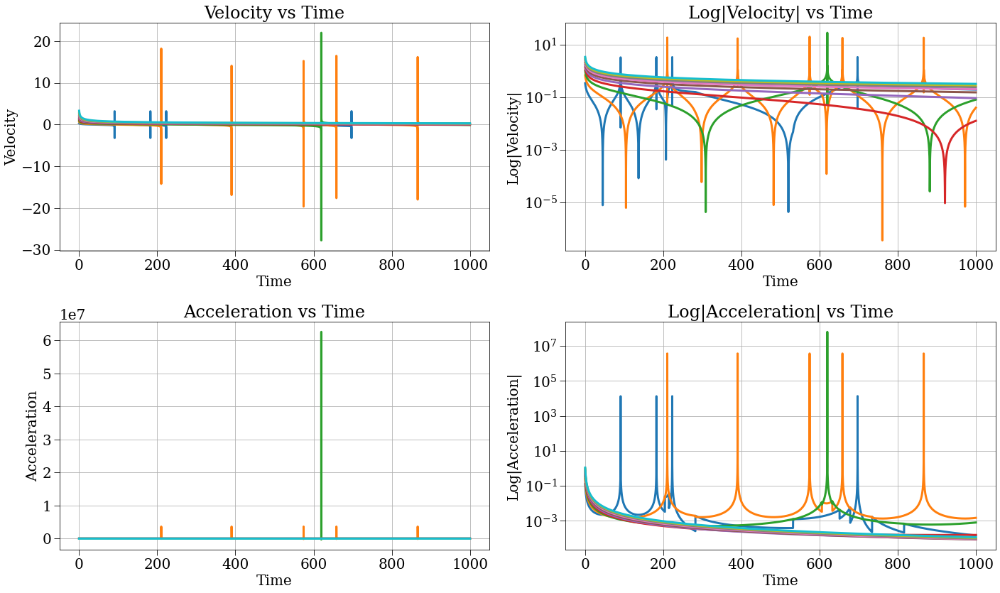

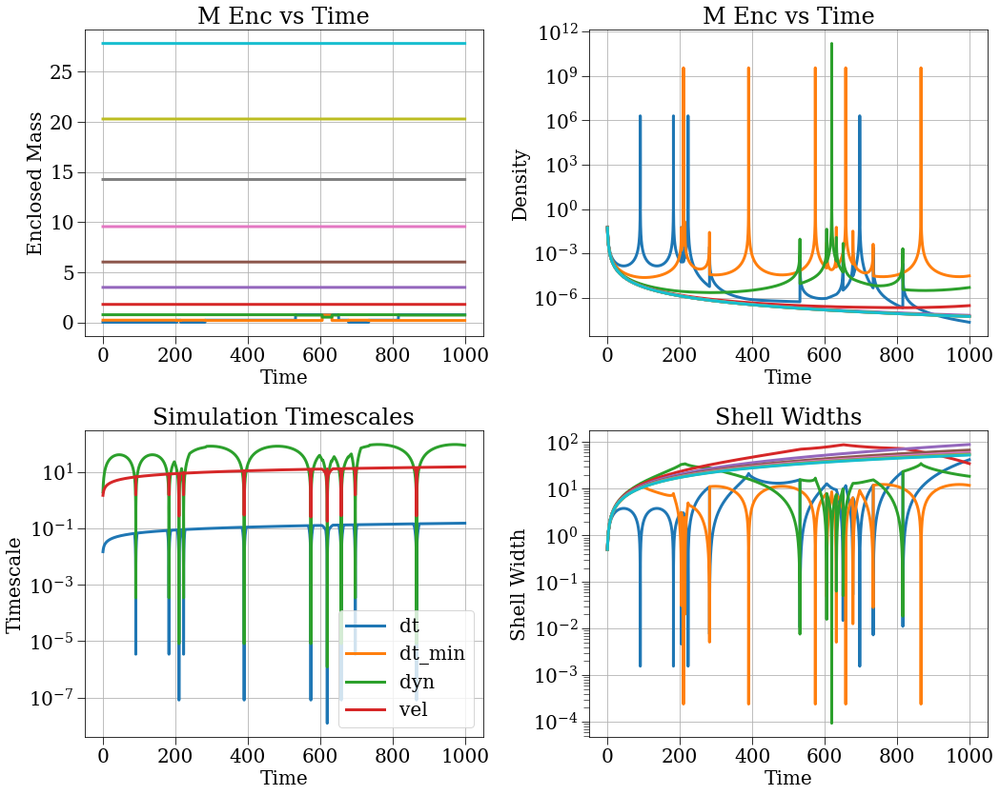

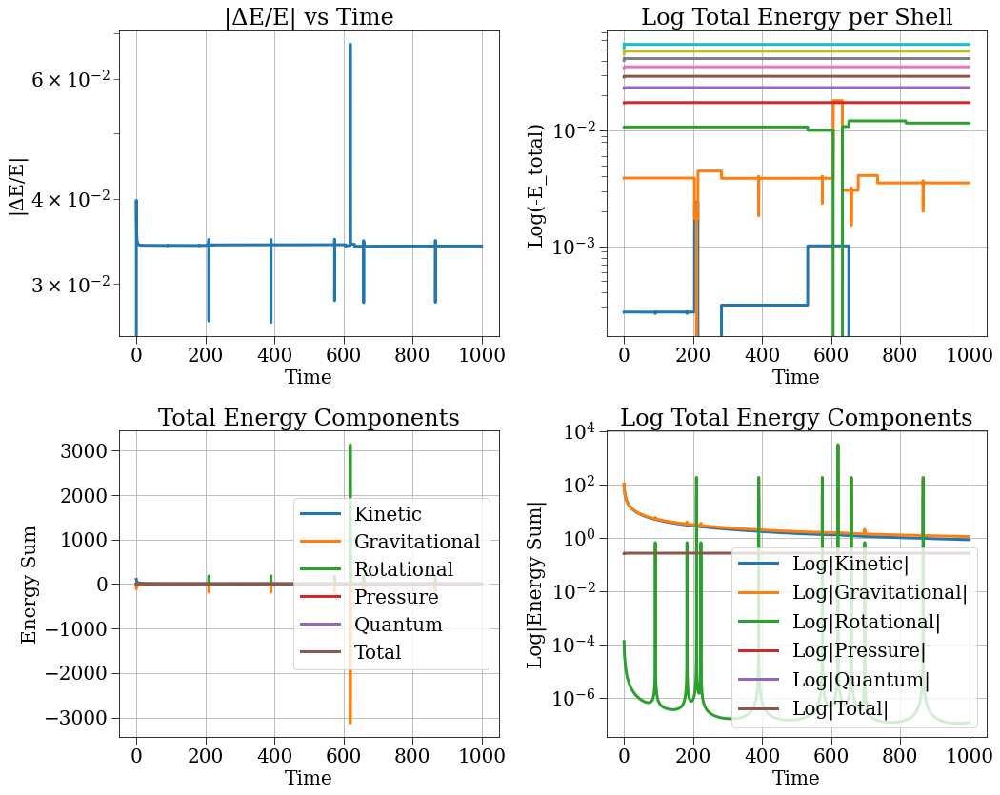

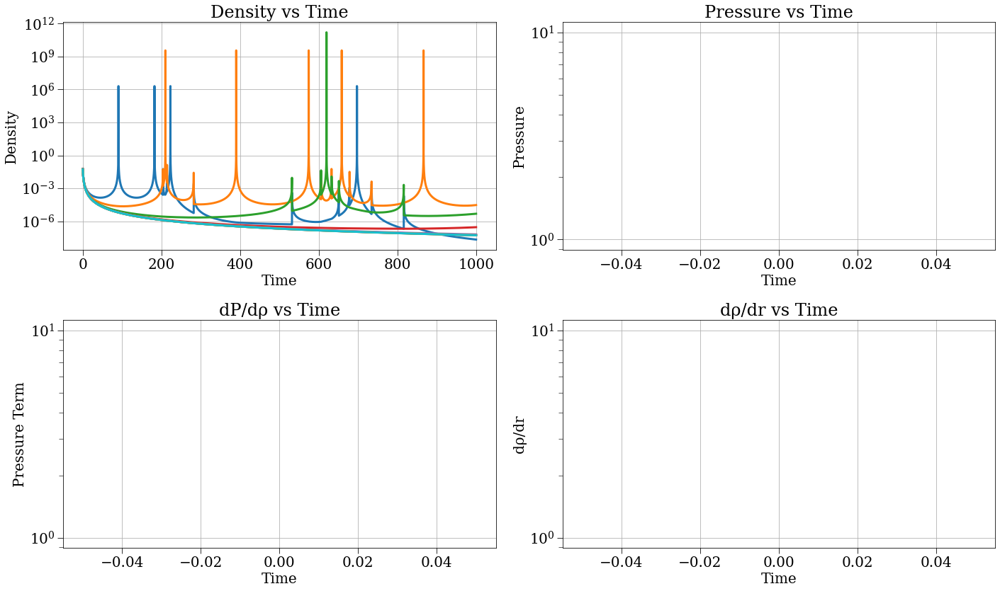

[0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]


In [14]:
s, r, c = run_and_plot(config_gauss)
print(r['r'][0,:])

2025-05-05 17:35:00,083 - collapse - INFO - Simulation setup complete


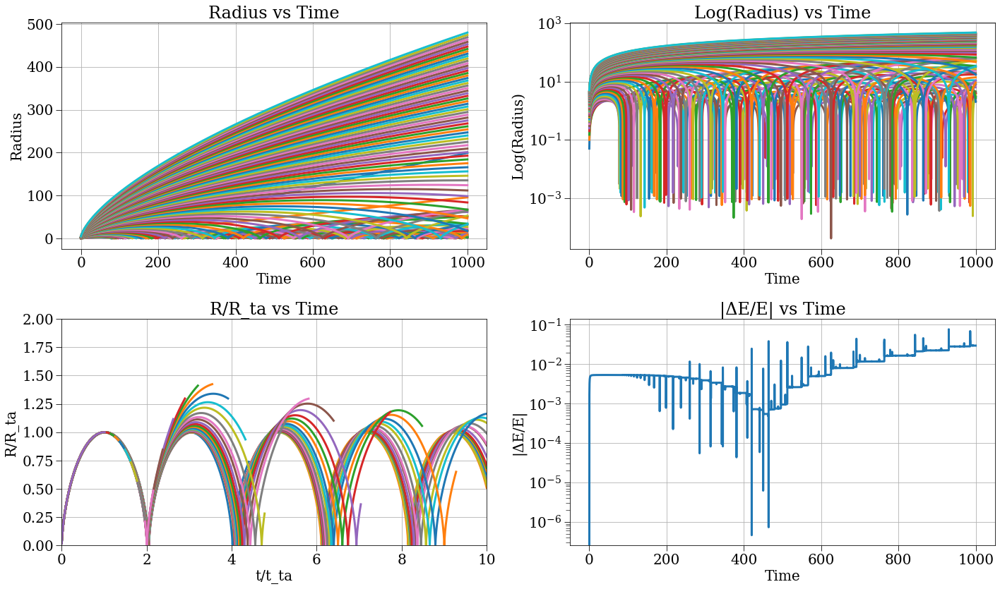

: 

: 

: 

In [36]:
s, r, c = run_and_plot(config_gauss) #leapfrog_kdk
print(r['r'][0,:])

2025-05-05 17:30:50,101 - collapse - INFO - Simulation setup complete


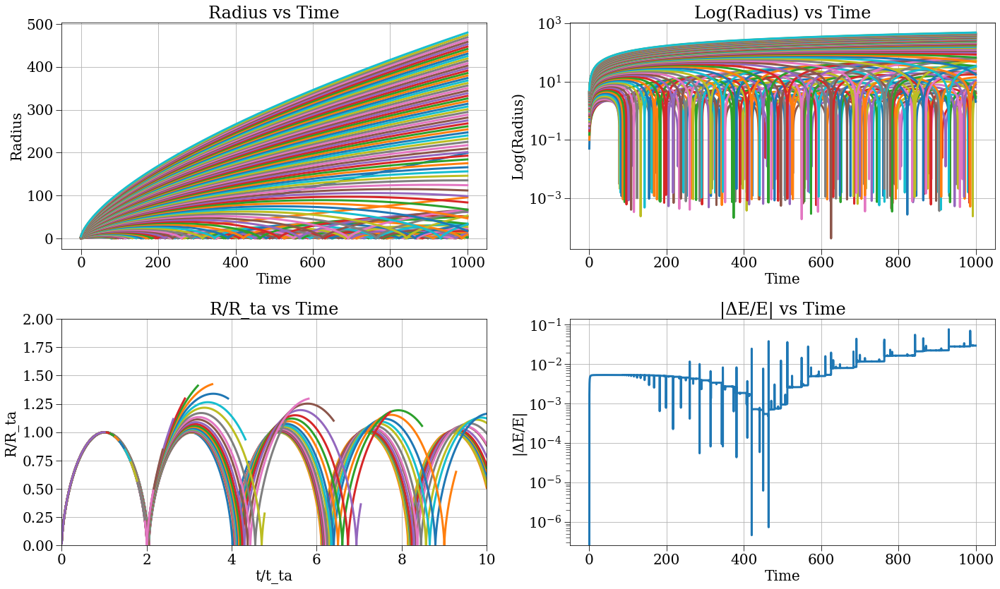

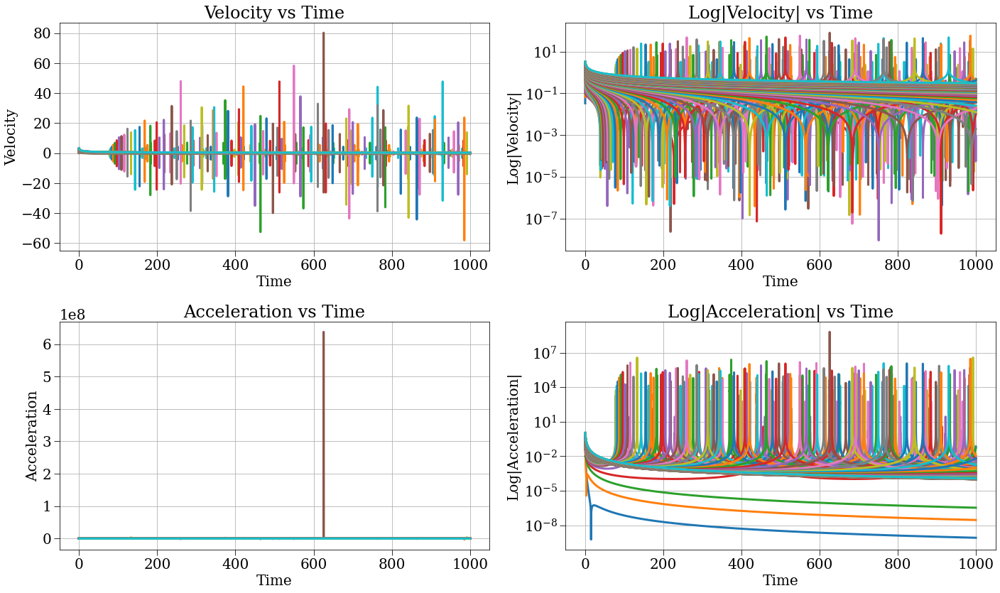

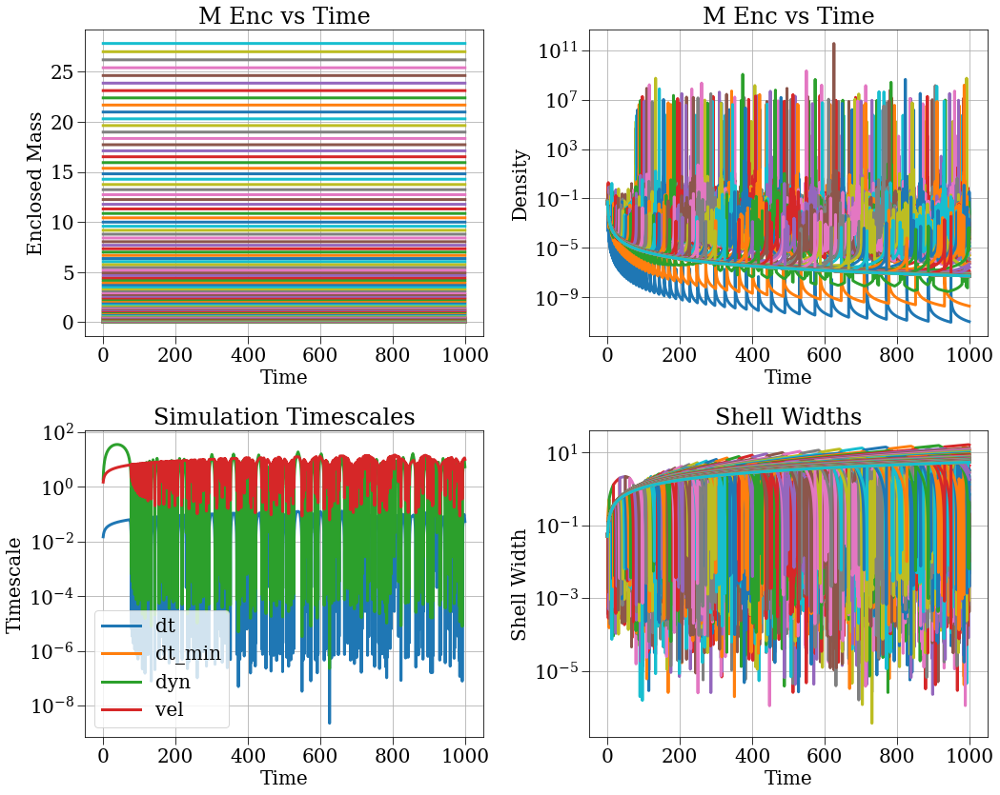

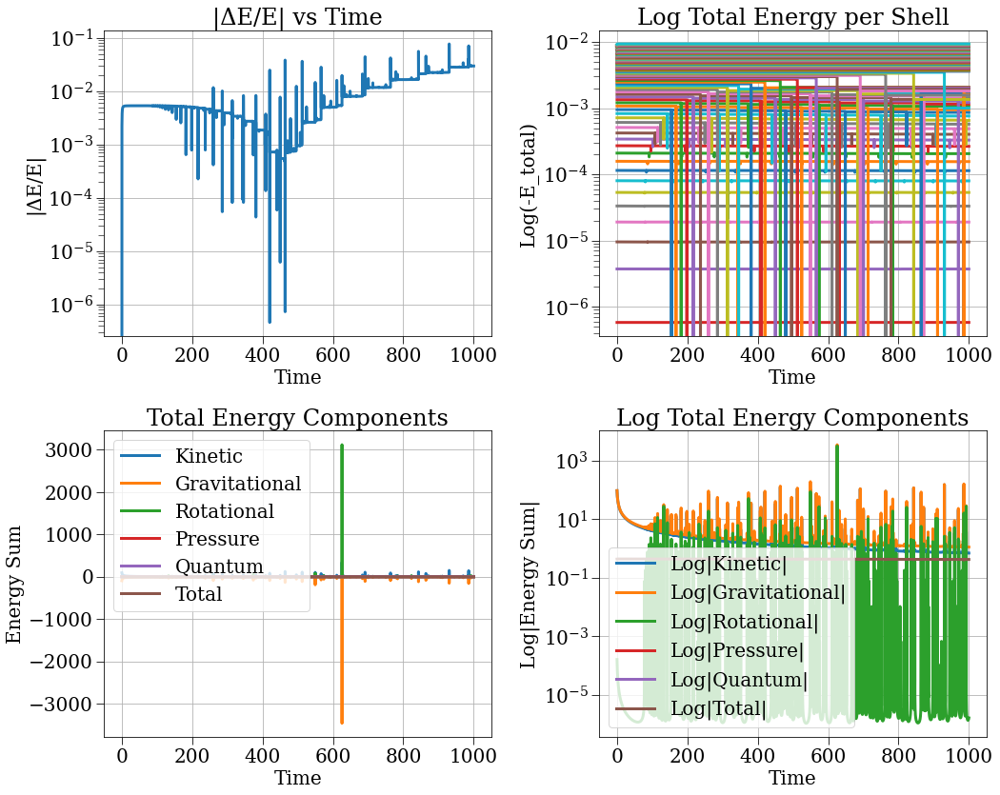

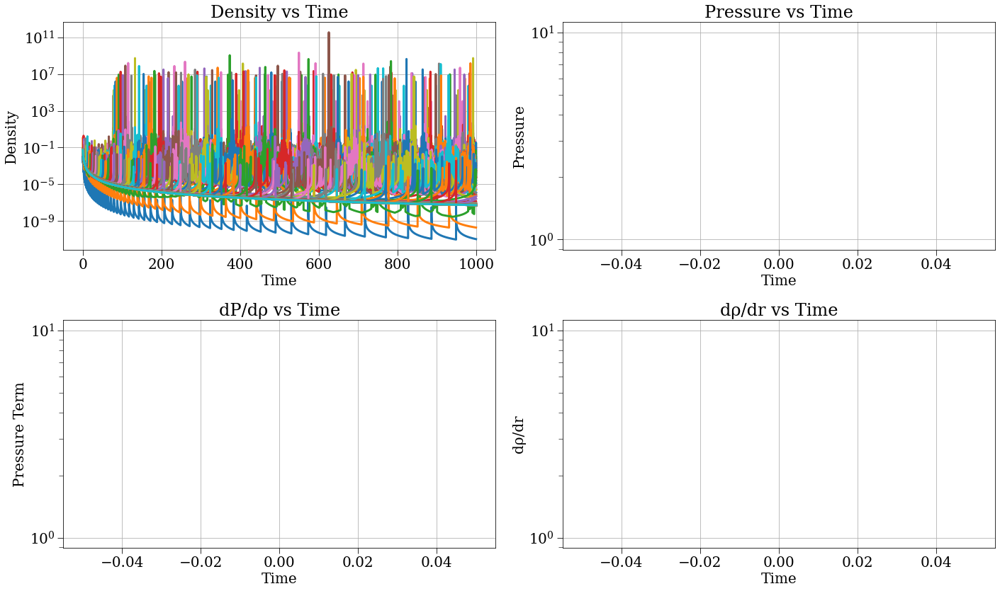

[0.05 0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7
 0.75 0.8  0.85 0.9  0.95 1.   1.05 1.1  1.15 1.2  1.25 1.3  1.35 1.4
 1.45 1.5  1.55 1.6  1.65 1.7  1.75 1.8  1.85 1.9  1.95 2.   2.05 2.1
 2.15 2.2  2.25 2.3  2.35 2.4  2.45 2.5  2.55 2.6  2.65 2.7  2.75 2.8
 2.85 2.9  2.95 3.   3.05 3.1  3.15 3.2  3.25 3.3  3.35 3.4  3.45 3.5
 3.55 3.6  3.65 3.7  3.75 3.8  3.85 3.9  3.95 4.   4.05 4.1  4.15 4.2
 4.25 4.3  4.35 4.4  4.45 4.5  4.55 4.6  4.65 4.7  4.75 4.8  4.85 4.9
 4.95 5.  ]


In [34]:
s, r, c = run_and_plot(config_gauss) #verlet
print(r['r'][0,:])

In [36]:
p1, s1 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_absorb_N100_se3')
p2, s2 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_N500_se3_fdm5')
ps = [p1, p2]
ss = [s1, s2]

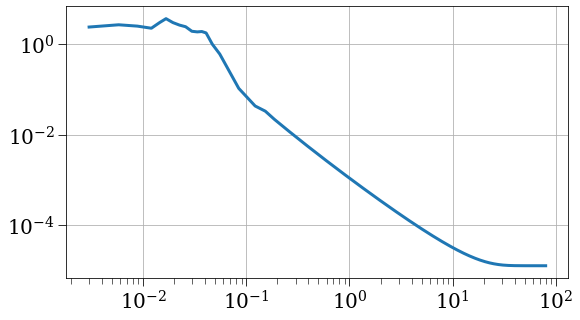

In [37]:
plt.loglog(ss[1]['r'][-1,:], ss[1]['rho_r'][-1,:], ls='-',) # plot derivatives for different methods
p1, s1 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_N100_se3_fdm5')
#plt.loglog(ss[1]['r'][-1,:], ss[1]['rho_r'][-1,:], ls='--',) # plot derivatives for different methods


In [4]:
t_end = s2['t'][-1] + 0.1

(63, 63.43840282972818)

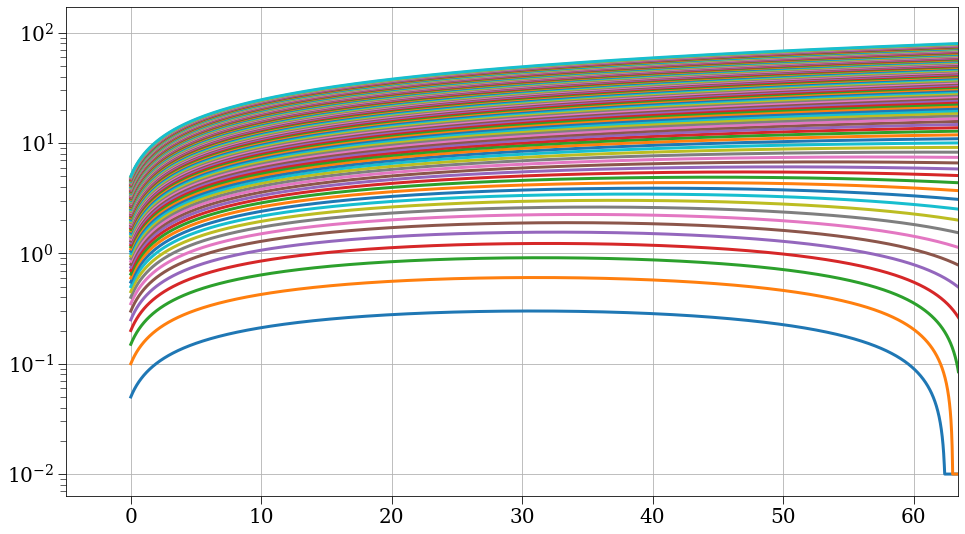

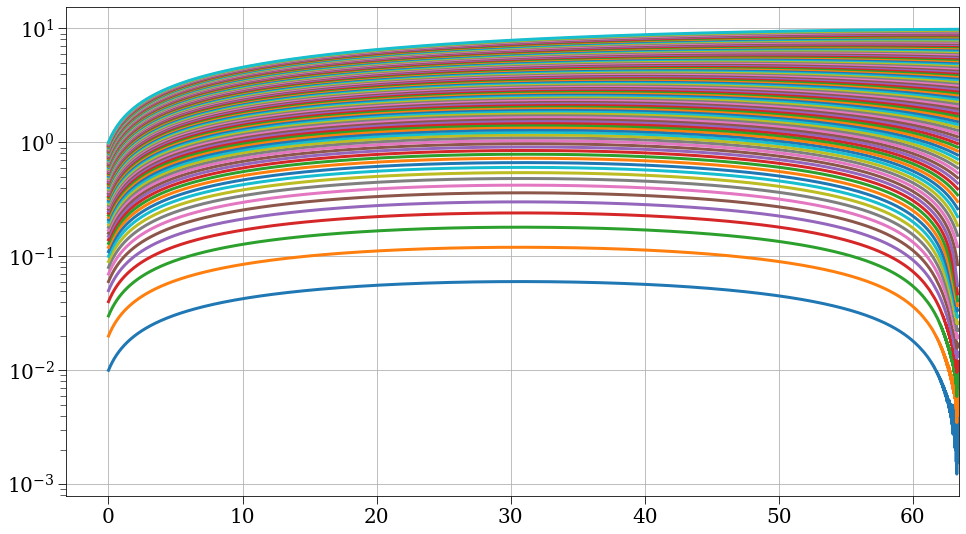

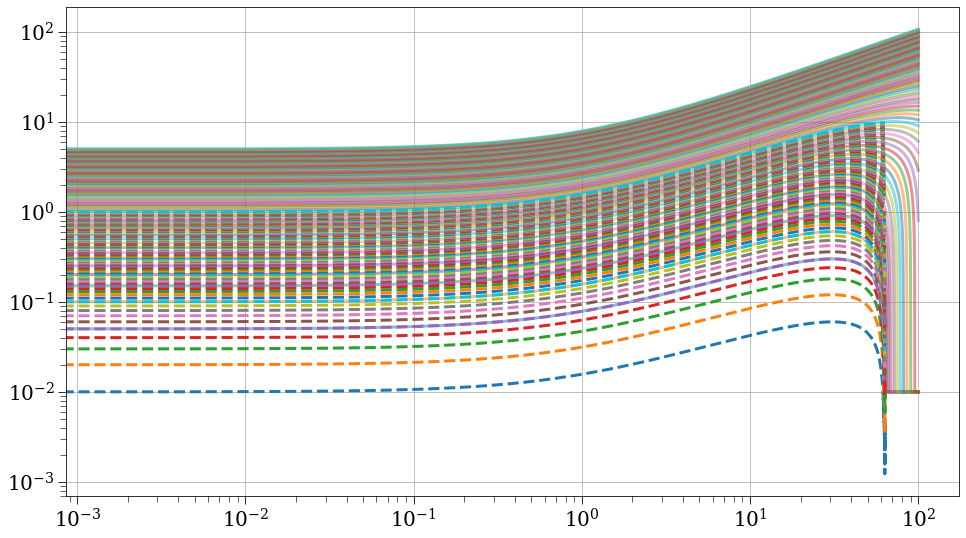

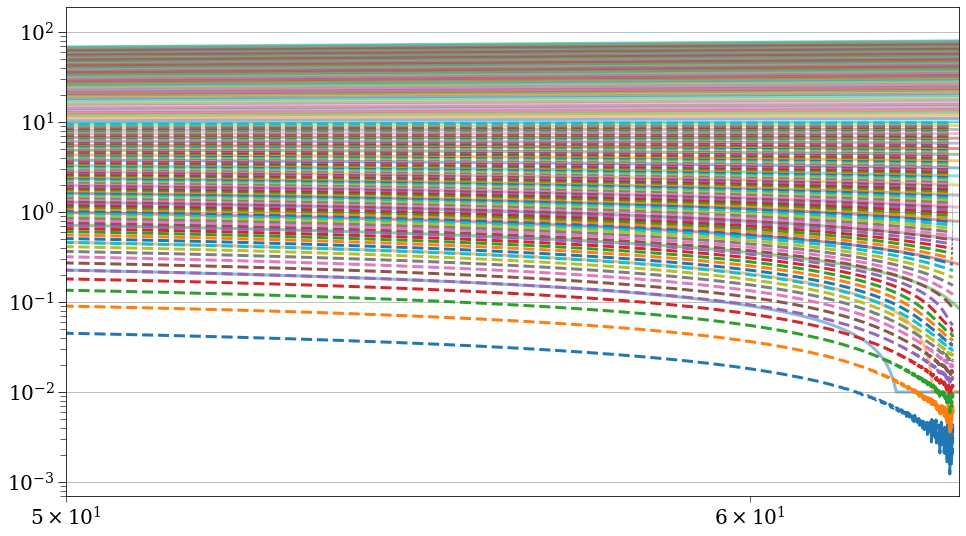

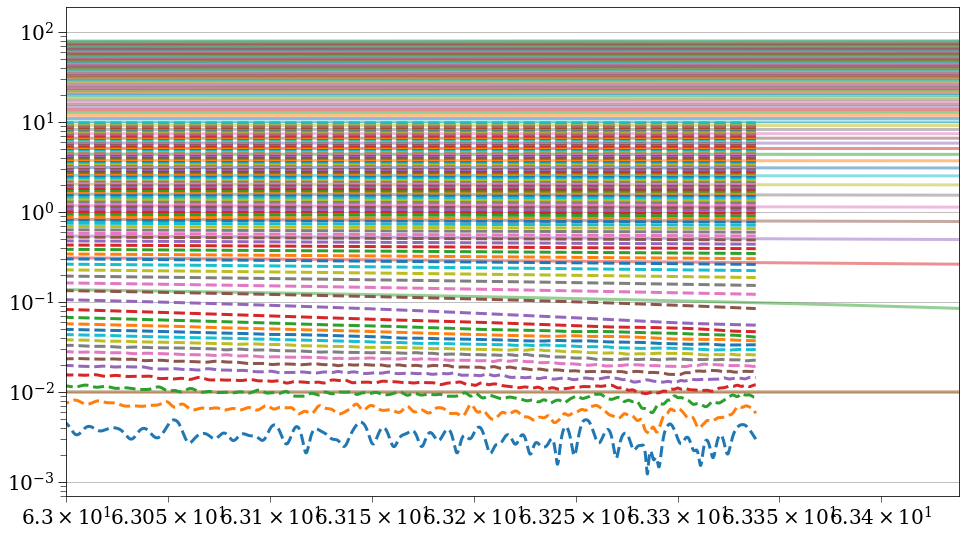

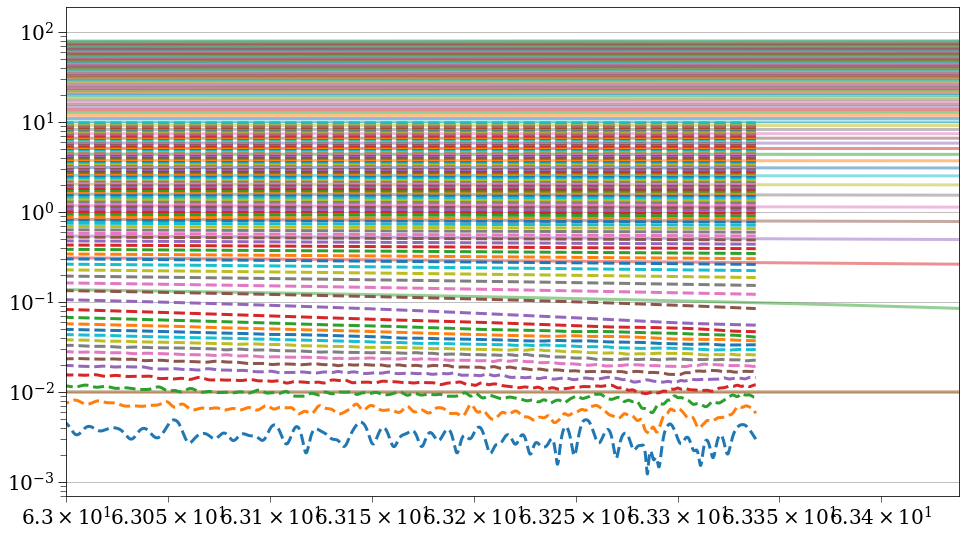

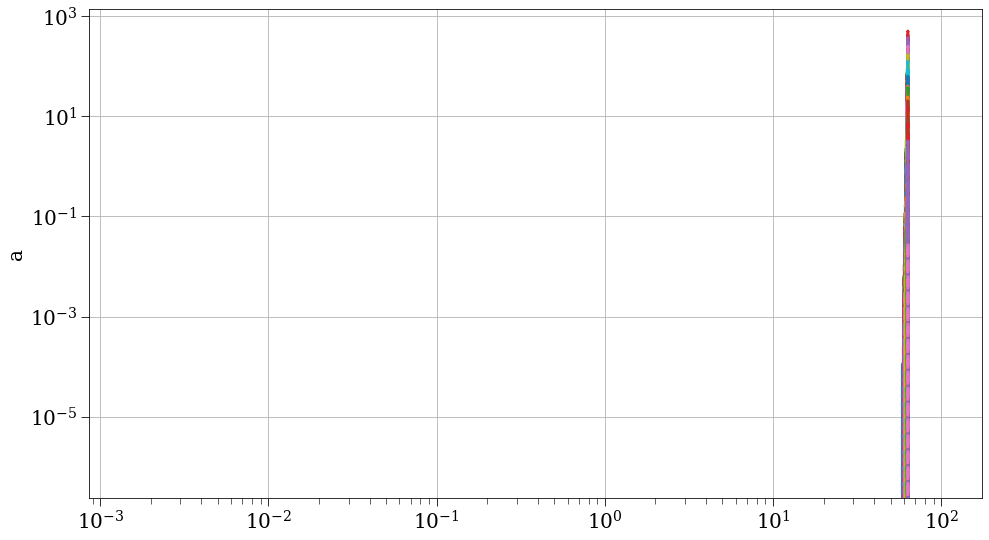

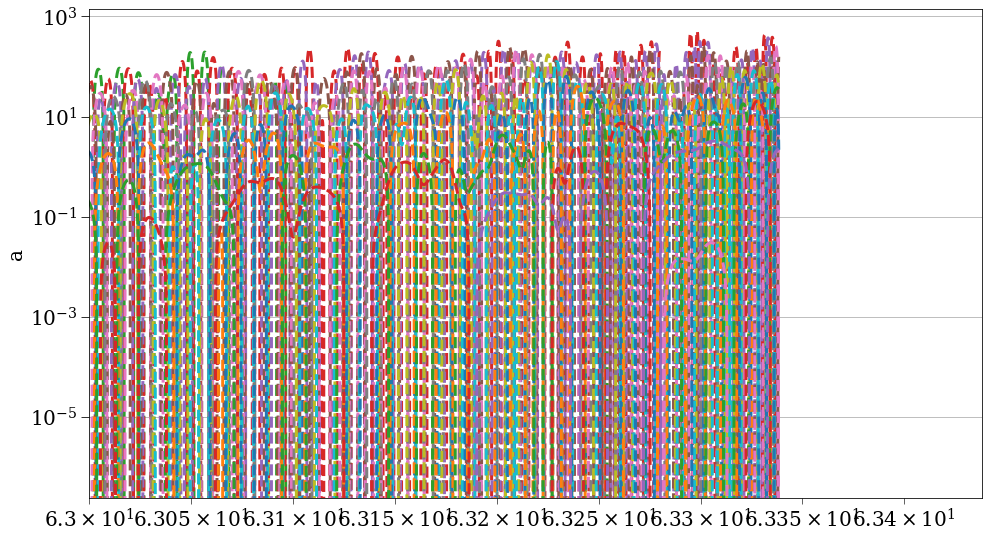

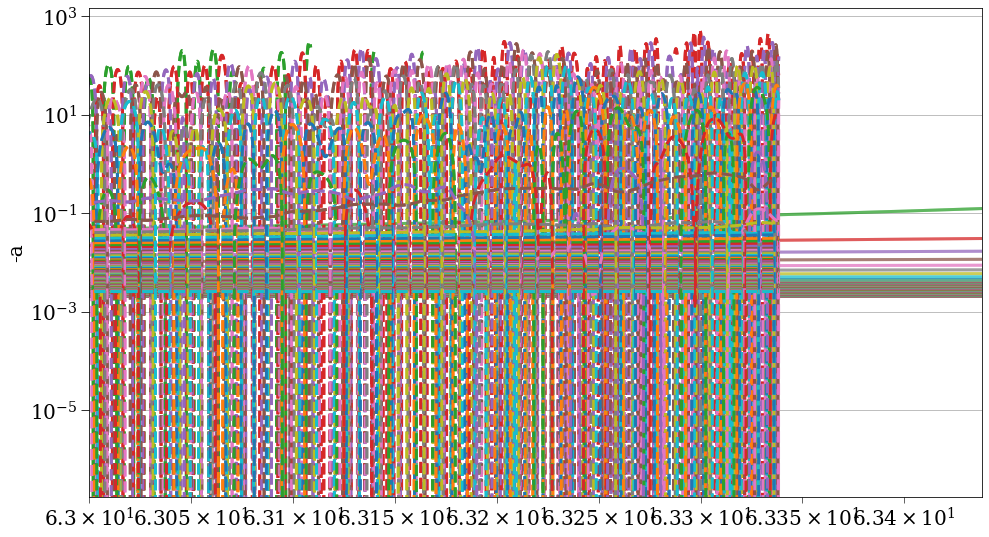

In [6]:
ls = ['-', '--', ':']
alphas = [0.5, 1, 0.3]
N=100
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[0]['t'], ss[0]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[1]['t'], ss[1]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(5e1, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(63, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(63, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.xlim(63, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
plt.xlim(63, t_end)


In [4]:
p1, s1 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_absorb_N100_se3')
p2, s2 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_N100_se3_fdm5')
ps = [p1, p2]
ss = [s1, s2]

In [5]:
t_end = s2['t'][-1] + 0.1

(63.793499989962434, 63.85349998996243)

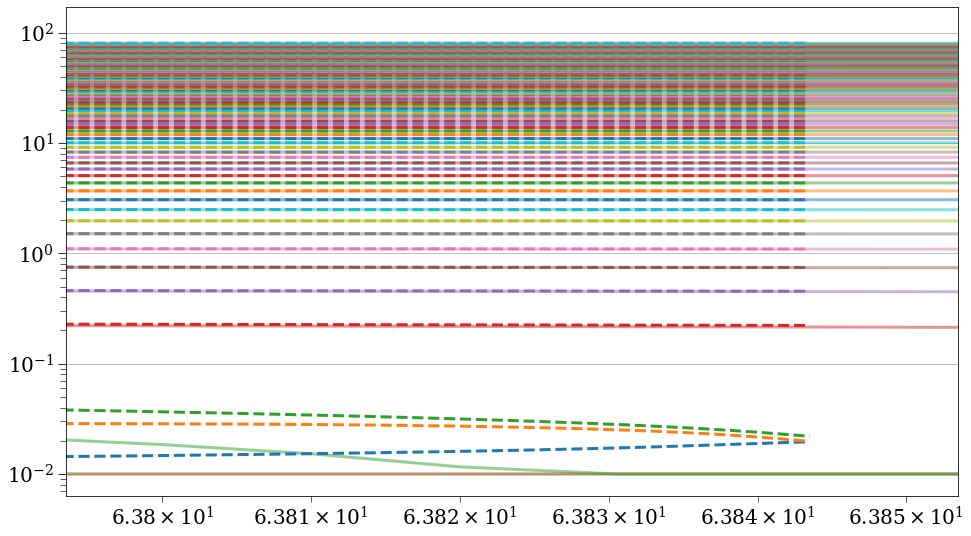

In [11]:
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(t_end-0.15, t_end-0.09)

In [21]:
np.argwhere(ss[0]['t'] > s2['t'][-1])

array([[ 6385],
       [ 6386],
       [ 6387],
       ...,
       [ 9998],
       [ 9999],
       [10000]])

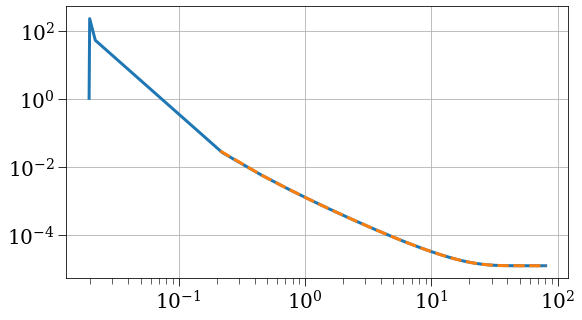

In [26]:
plt.loglog(ss[1]['r'][-1,:], ss[1]['rho_r'][-1,:], ls='-',)
plt.loglog(ss[0]['r'][6385,:], ss[0]['rho_r'][6385,:], ls='--',)

(60, 63.94349998996243)

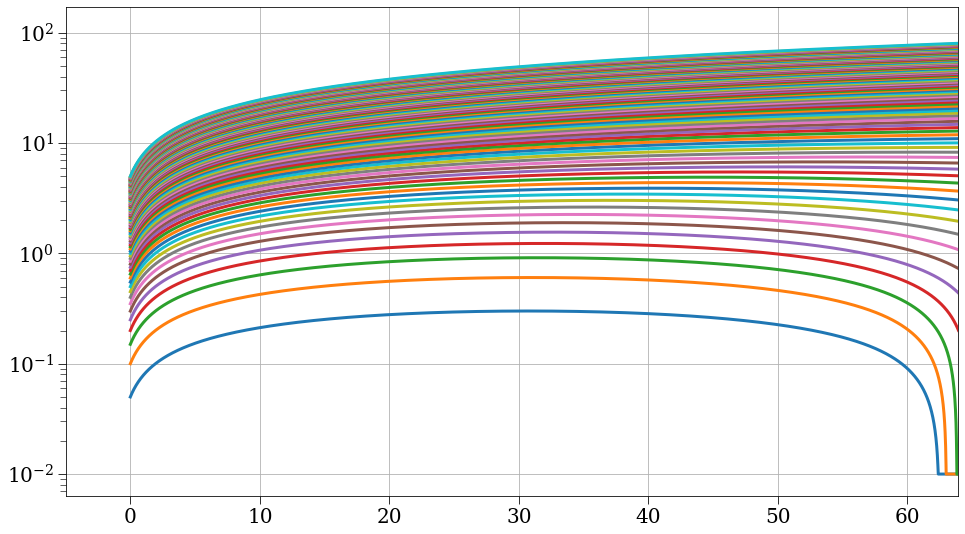

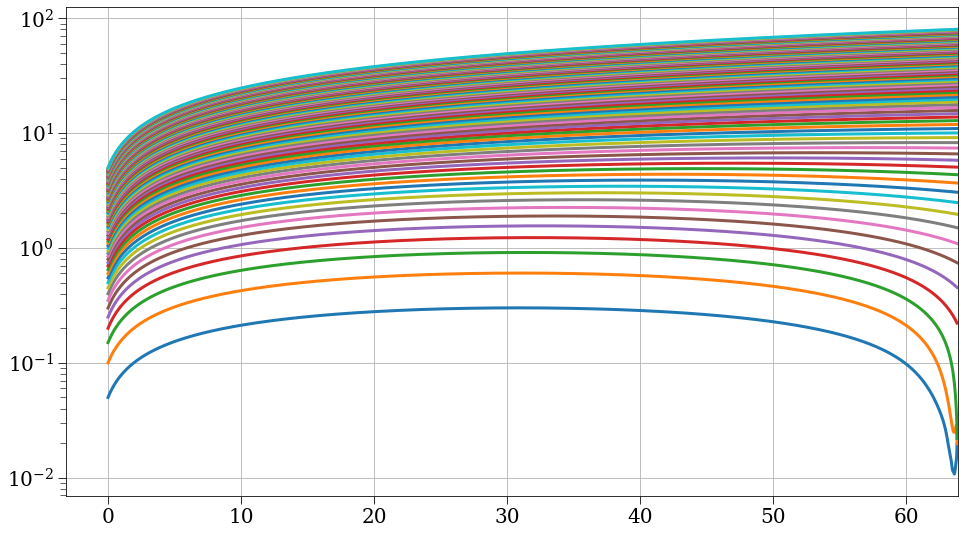

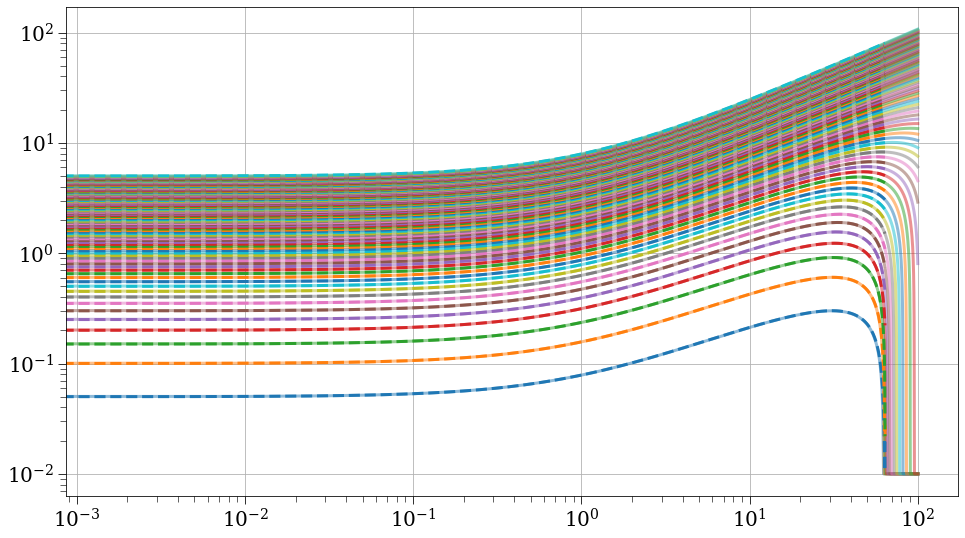

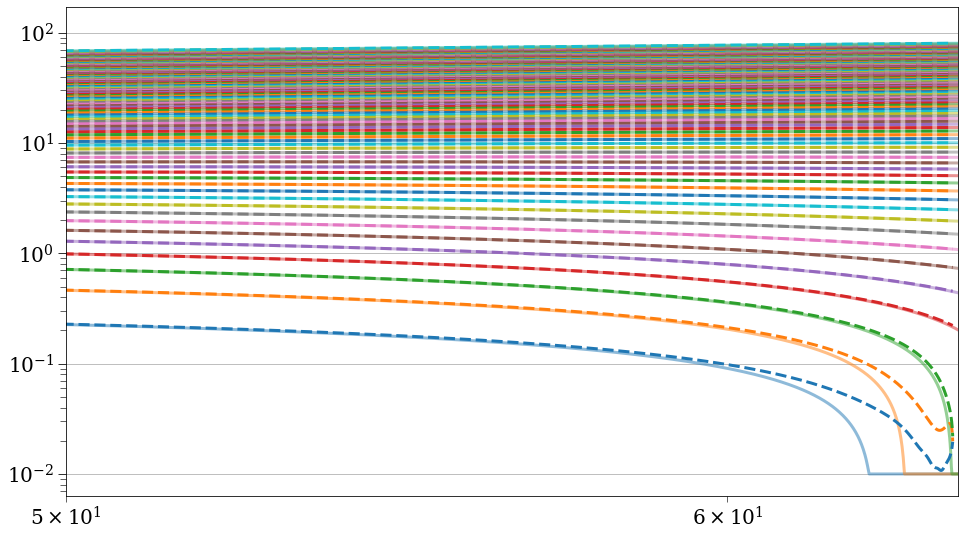

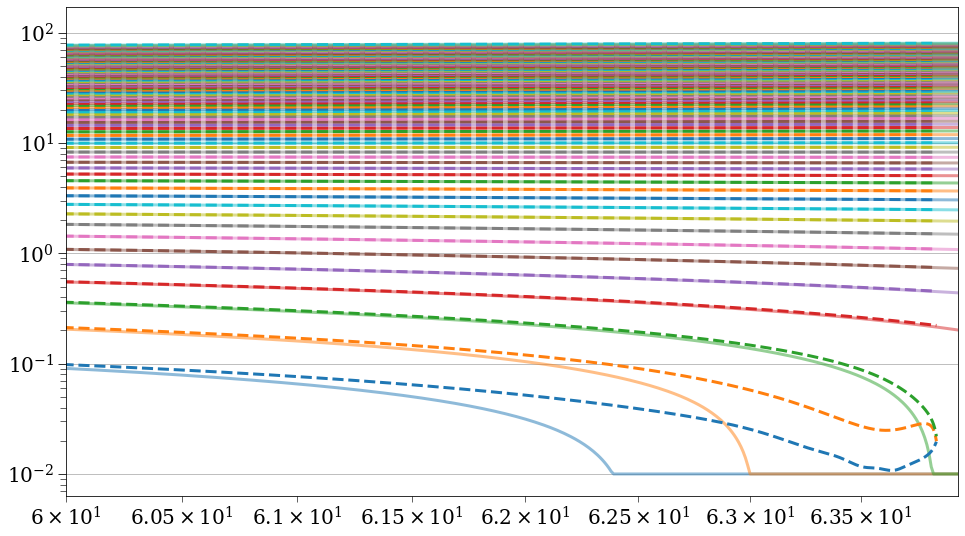

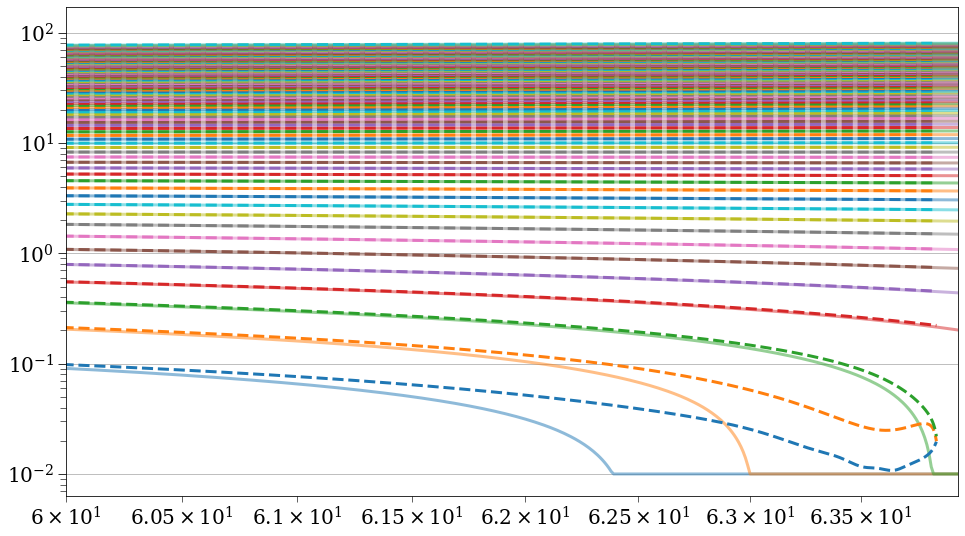

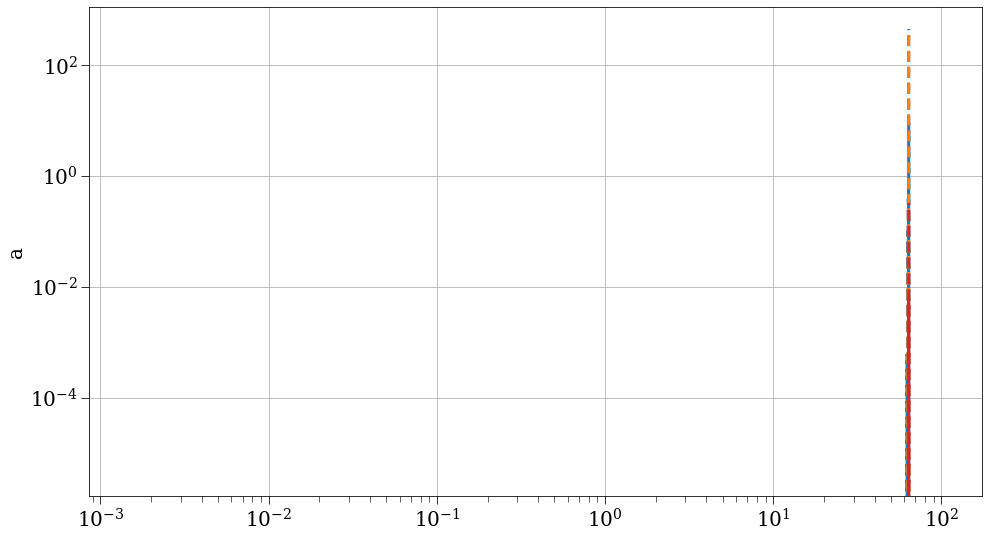

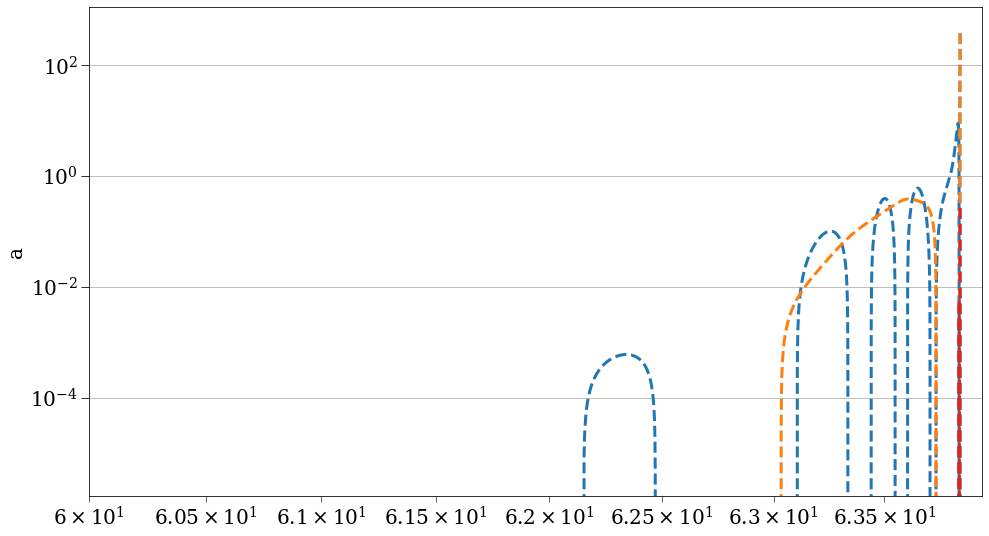

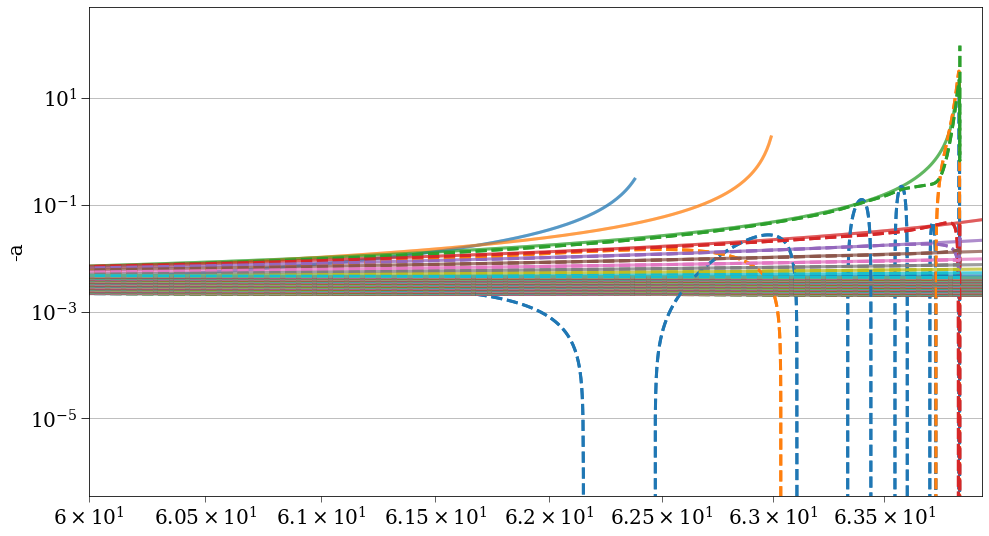

In [6]:
ls = ['-', '--', ':']
alphas = [0.5, 1, 0.3]
N=100
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[0]['t'], ss[0]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[1]['t'], ss[1]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(5e1, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
plt.xlim(60, t_end)


In [30]:
p1, s1 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_absorb_N100_se3')
p2, s2 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_N100_se3_fdm4')
ps = [p1, p2]
ss = [s1, s2]

In [36]:
t_end = s2['t'][-1] + 0.1


(60, 66.41749993476431)

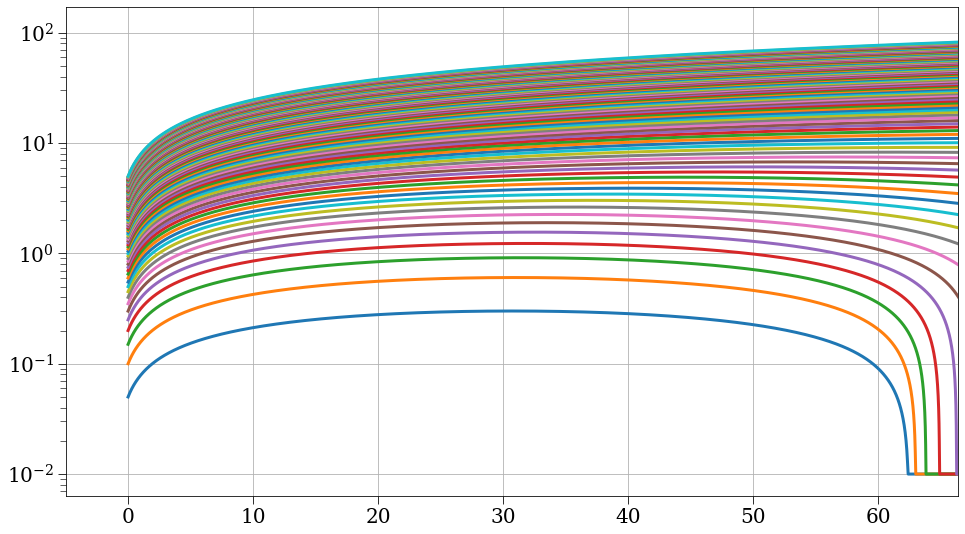

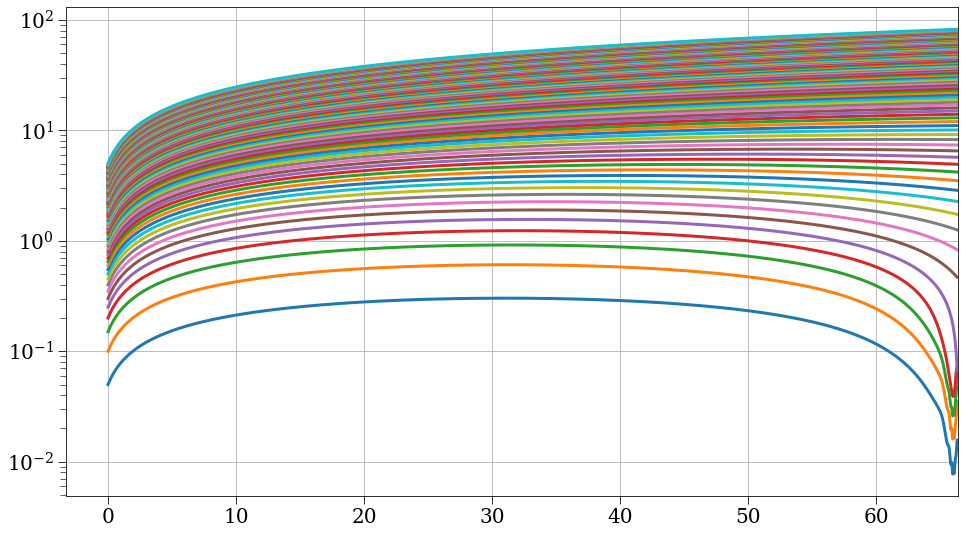

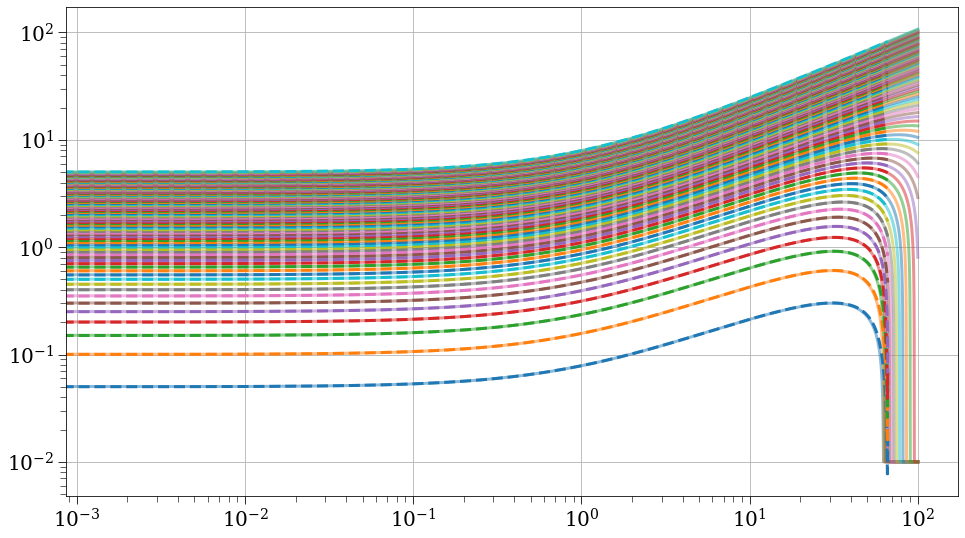

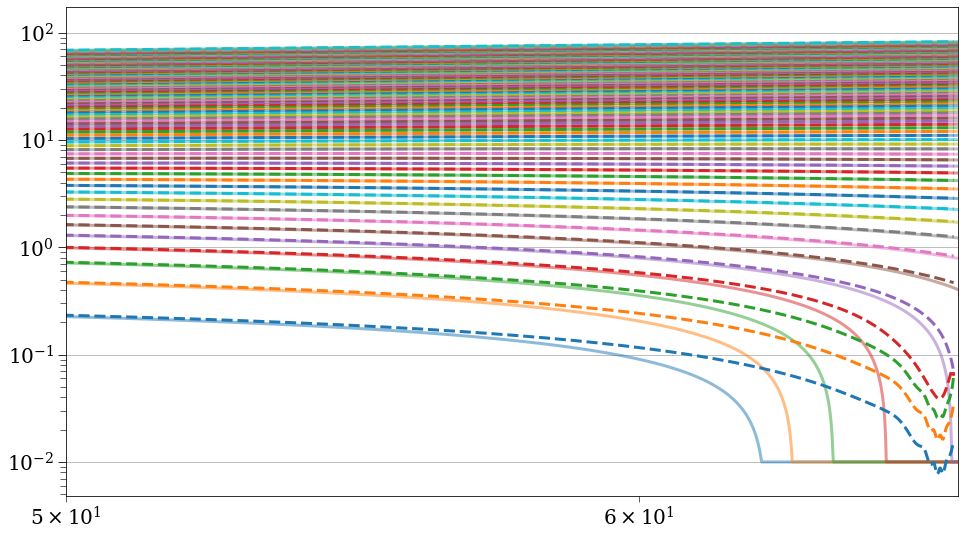

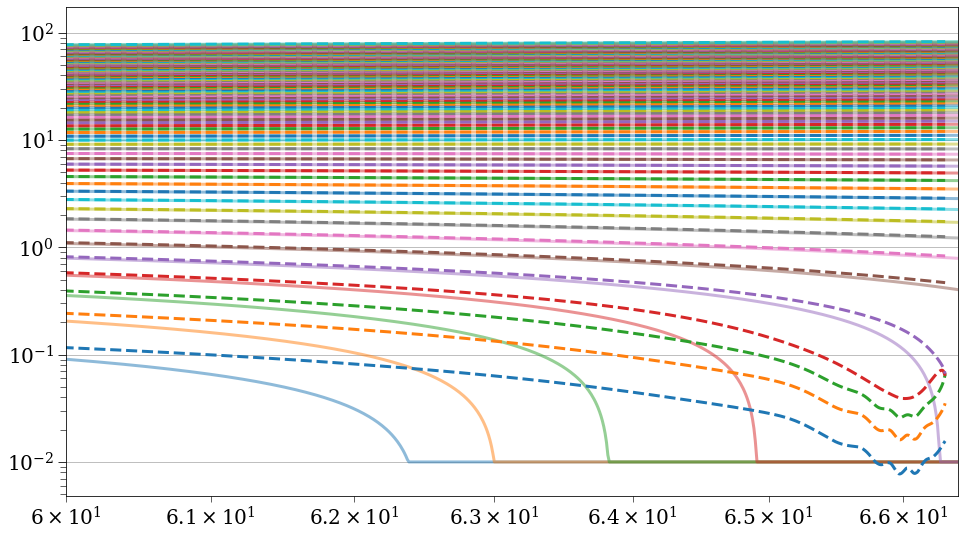

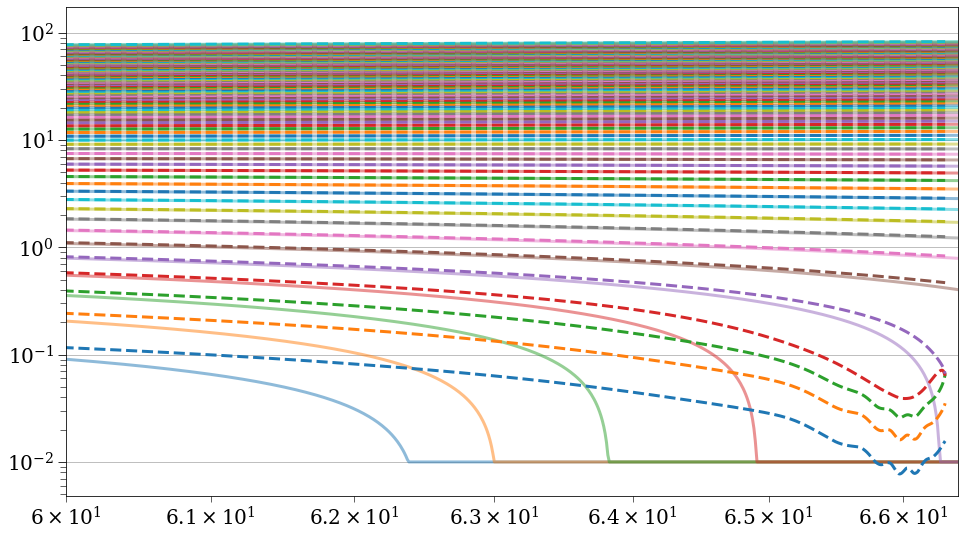

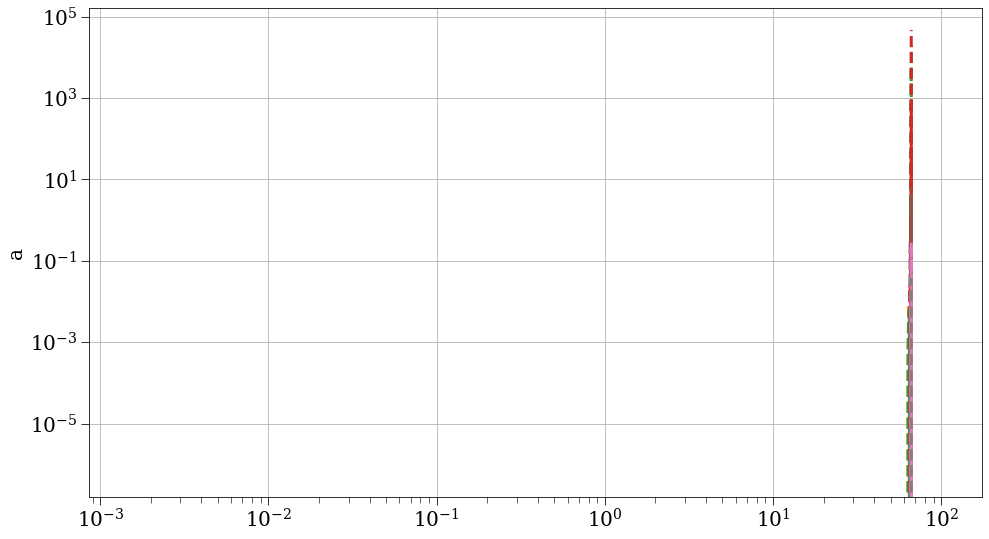

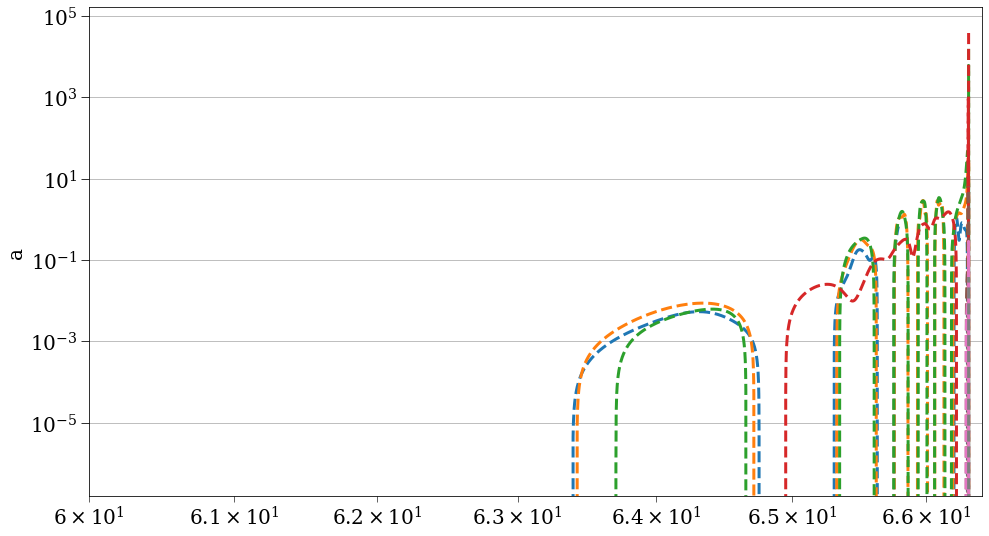

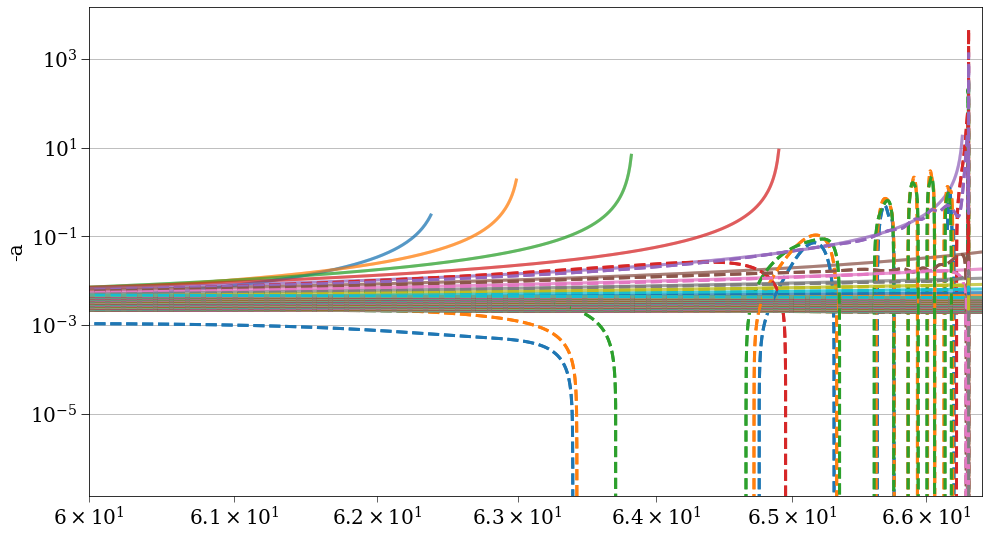

In [37]:
ls = ['-', '--', ':']
alphas = [0.5, 1, 0.3]
N=100
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[0]['t'], ss[0]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[1]['t'], ss[1]['r'][:,k]) for k in range(N)];
plt.xlim(None, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(5e1, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.xlim(60, t_end)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
plt.xlim(60, t_end)


In [96]:
p1, s1 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_absorb_N100_se3')
p2, s2 = load_simulation_data('/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/runs/gauss_N100_se3_fdm3')
ps = [p1, p2]
ss = [s1, s2]


(70, 73)

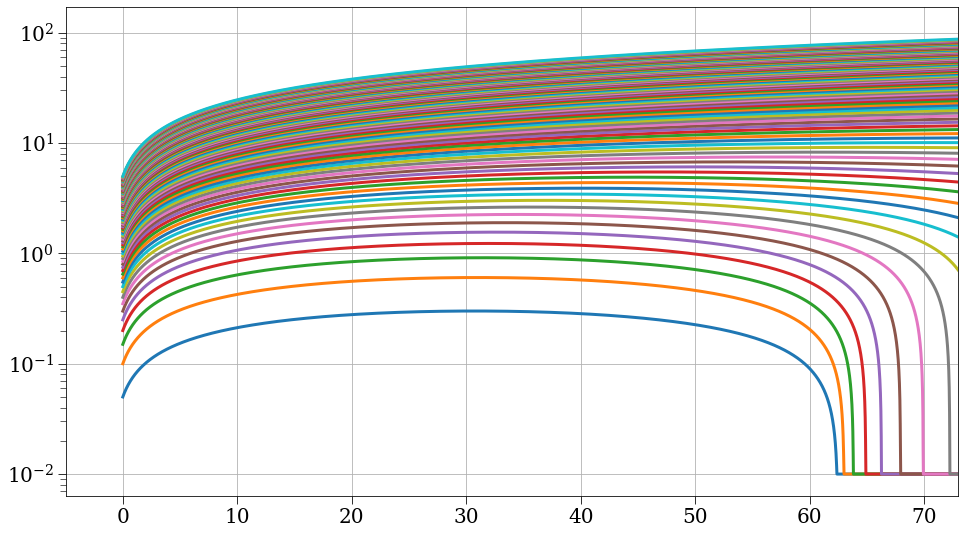

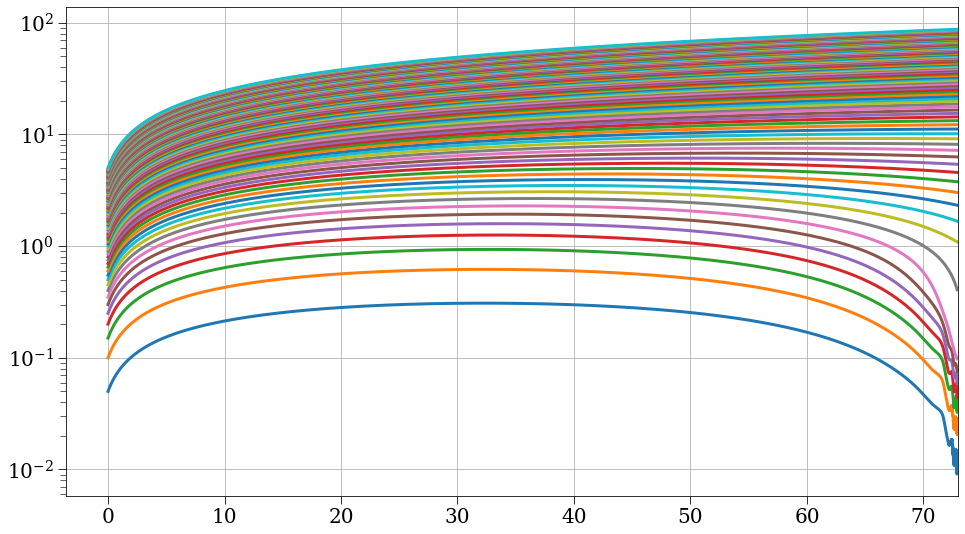

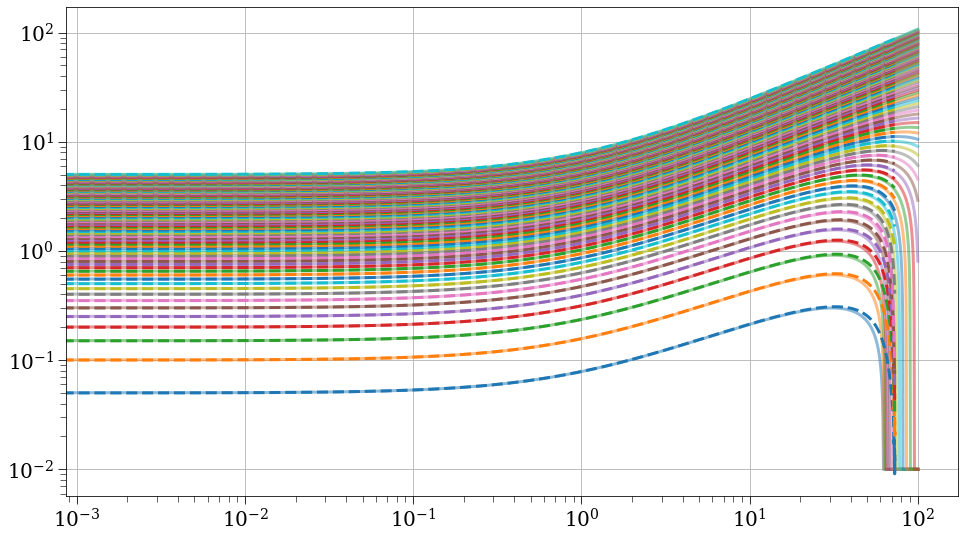

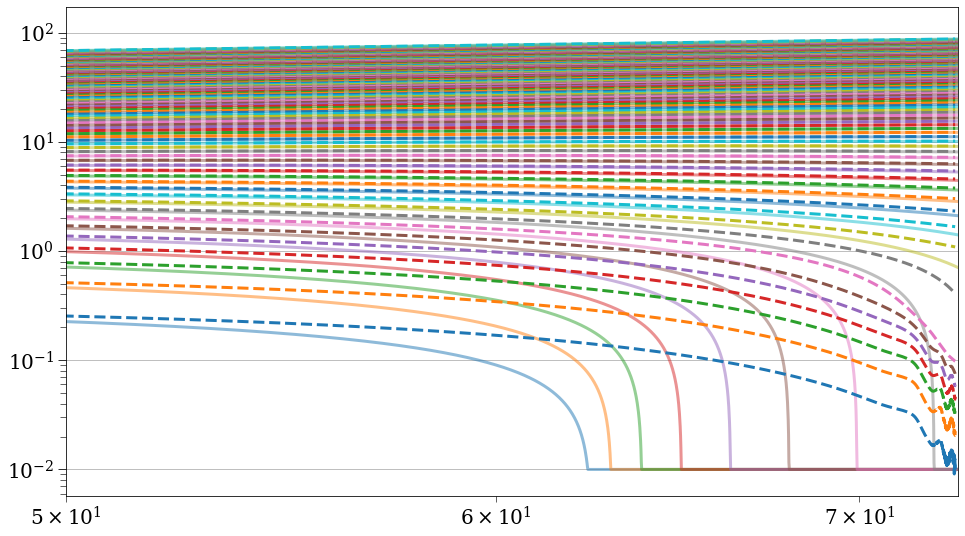

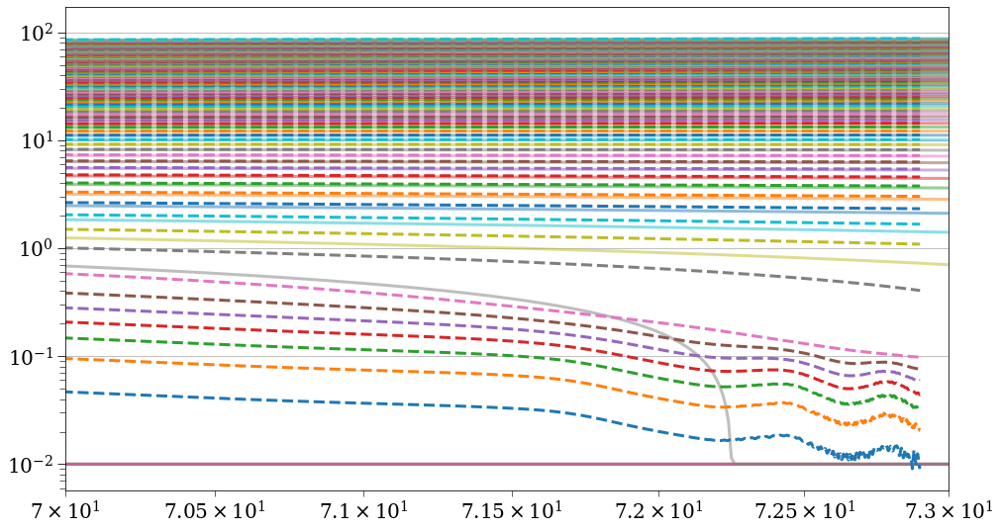

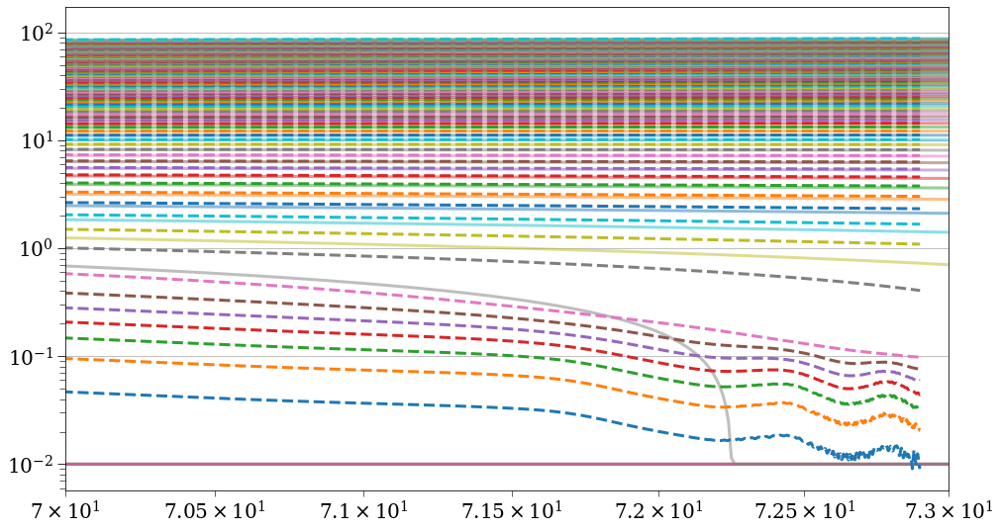

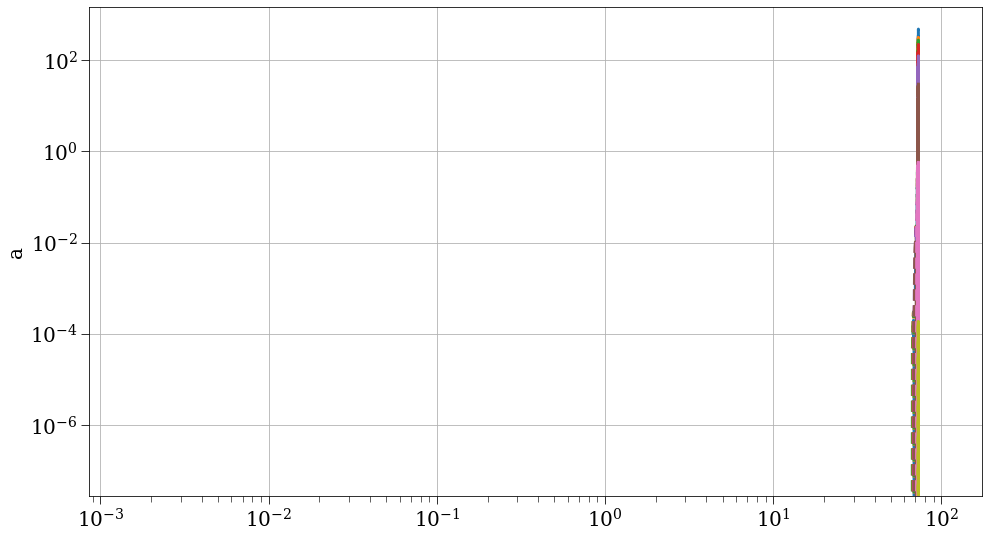

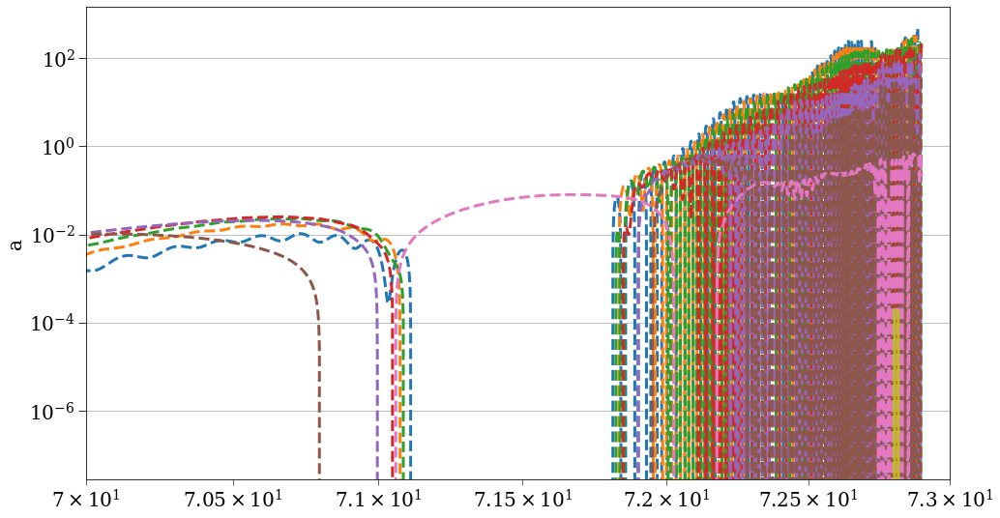

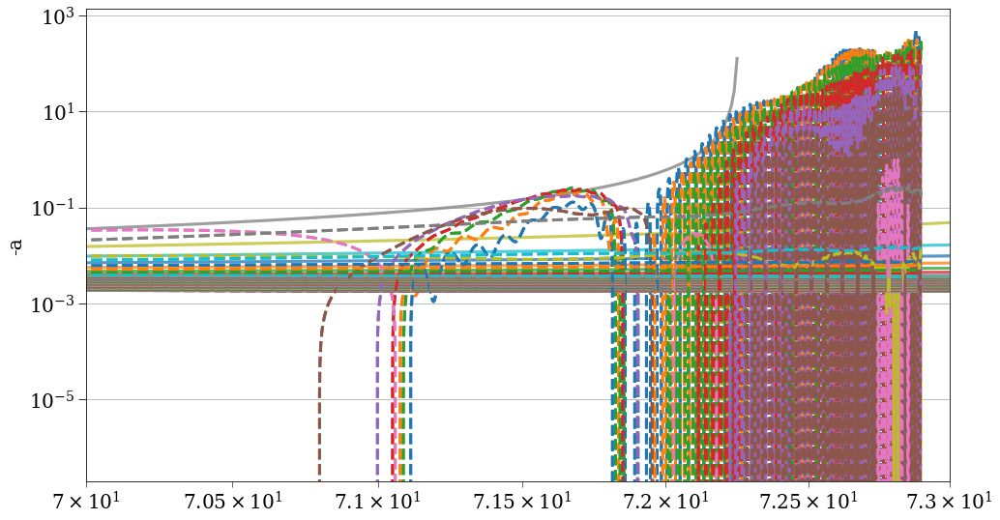

In [122]:
ls = ['-', '--', ':']
alphas = [0.5, 1, 0.3]
N=100
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[0]['t'], ss[0]['r'][:,k]) for k in range(N)];
plt.xlim(None, 73)
plt.figure(figsize=(16, 9))
[plt.semilogy(ss[1]['t'], ss[1]['r'][:,k]) for k in range(N)];
plt.xlim(None, 73)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(5e1, 73)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(70, 73)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    [plt.loglog(ss[i]['t'], ss[i]['r'][:,k], ls=ls[i], alpha=alphas[i]) for k in range(N)];
plt.xlim(70, 73)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, a, ls=ls[i], alpha=alphas[i])
plt.ylabel('a')
plt.xlim(70, 73)
plt.figure(figsize=(16, 9))
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
for i in range(len(ps)):
    t = ss[i]['t']
    for k in range(N):
        a = ss[i]['a'][:,k]
        r = ss[i]['r'][:,k]
        a = np.where(r > 1e-2, a, np.nan)
        plt.loglog(t, -a, ls=ls[i], alpha=alphas[i])
plt.ylabel('-a')
plt.xlim(70, 73)
